# Init

In [1]:
import pandas as pd
import numpy as np

from src.general_analysis.engine import AnalysisEnvironment
from src.barter.regression_models import create_regression_runner
from src.utils import interactive_regression_results_selector

# Load data

In [2]:
env = AnalysisEnvironment(active_analysis='barter_deals', sandbox_mode=False)

# Load everything
final_df, og_df = env.load_data(use_cache=True, force_refresh=False)
pm, prompt_map = env.load_prompts()

Loading files for analysis Barter Deals Analysis
⚡ Loading cached DataFrame from C:\Users\Wouter Barter\Documents\AI_thesis\results\BARTER_DEALS\BARTER_DEALS_analysis_ready.pkl...
PromptManager initialized with folder: ..\prompts\PromptSuites\BARTER_DEALS
Scanning 7 suites from ..\prompts\PromptSuites\BARTER_DEALS...
Loaded 7 PromptSuites


# Data pre-processing

## Filter out zero-word text rows

In [3]:
final_df = final_df[~((final_df['text_word_count'] < 2) &
                      (final_df['requirements_word_count'] < 2))]

## Human readable cols

In [4]:
# Human readable prompt names

# prompt_map_clean = {
#     'dbadc59142e9': 'Holistic Naive (1D)',
#     '38c4714f0e3a': 'Holistic Informed (3D)',
#     '1e1ff82a28e2': 'Formative (10D)'
# }

prompt_map_clean = {
    'dbadc59142e9': 'Holistic Naive',
    '38c4714f0e3a': 'Macro-Formative',
    '1e1ff82a28e2': 'Formative'
}


final_df['prompt_name'] = final_df['prompt_id'].map(prompt_map_clean)


# Analysis group concatenation

final_df['analysis_group'] = final_df['model_name'] + \
    "_" + final_df['prompt_id']
final_df['analysis_group_full'] = final_df['model_name'] + "_" + \
    final_df['prompt_id'] + "_" + final_df['dimension_name']
final_df['analysis_group_named'] = final_df['model_name'] + \
    "_" + final_df['prompt_name'] + "_" + final_df['prompt_id']

# Human readable model col
model_map_clean = {
    'google/gemma-4-E2B-it': "Gemma 4",
    'meta-llama/Llama-3.2-3B-Instruct': "Llama 3.2",
    'Qwen/Qwen3-4B-Instruct-2507': "Qwen 3",
    'Qwen/Qwen3.5-4B': "Qwen 3.5"
}
final_df['model_name_clean'] = final_df['model_name'].map(model_map_clean)


# Clean dimension names
dim_map_clean = {
    # Holistic
    'deal_pitch_overall_deal_attractiveness': 'Holistic\nDeal Attractiveness',

    # Macro-Formative
    'deal_pitch_overall_reward_value': 'Macro-Formative\nReward Value',
    'deal_pitch_overall_task_demand': 'Macro-Formative\nTask Demand',
    'deal_pitch_overall_pitch_quality': 'Macro-Formative\nPitch Quality',

    # Formative
    'deal_pitch_brand_prestige': 'Formative\nBrand Prestige',
    'deal_pitch_perceived_economic_value': 'Formative\nPerceived Economic Value',
    'deal_pitch_creator_brand_alignment': 'Formative\nCreator Brand Alignment',
    'deal_pitch_functional_utility': 'Formative\nFunctional Utility',
    'deal_pitch_product_universality': 'Formative\nProduct Universality',
    'deal_pitch_workload_volume': 'Formative\nWorkload Volume',
    'deal_pitch_creative_restrictiveness': 'Formative\nCreative Restrictiveness',
    'deal_pitch_call_to_action_strength': 'Formative\nCall To Action Strength',
    'deal_pitch_rhetorical_objectivity': 'Formative\nRhetorical Objectivity',
    'deal_pitch_proposition_clarity': 'Formative\nProposition Clarity'
}

# Automatically extract the exact values to ensure a 1:1 match
plot_order = list(dim_map_clean.values())

final_df['dimension_name_clean'] = final_df['dimension_name'].map(
    dim_map_clean)


# Human readable analysis group/ experimental group
final_df['analysis_group_full_clean'] = final_df['model_name_clean'] + \
    ": " + final_df['dimension_name_clean'] + \
    "(" + final_df['prompt_name'] + ")"

final_df['analysis_group_clean'] = final_df['model_name_clean'] + \
    " " + final_df['prompt_name']

C:\Users\Wouter Barter\AppData\Local\Temp\ipykernel_25452\2825759114.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_df['prompt_name'] = final_df['prompt_id'].map(prompt_map_clean)
C:\Users\Wouter Barter\AppData\Local\Temp\ipykernel_25452\2825759114.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_df['analysis_group'] = final_df['model_name'] + \
C:\Users\Wouter Barter\AppData\Local\Temp\ipykernel_25452\2825759114.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of 

## Other features

In [5]:
og_df['raw_input_word_count'] = og_df['title_word_count'] + \
    og_df['text_word_count'] + og_df['requirements_word_count']

og_df['log_raw_input_word_count'] = np.log1p(
    og_df['raw_input_word_count'])


og_df['raw_input_word_count_squared'] = np.square(
    og_df['raw_input_word_count'])

In [6]:
final_df['raw_input_word_count'] = final_df['title_word_count'] + \
    final_df['text_word_count'] + final_df['requirements_word_count']


final_df['log_raw_input_word_count'] = np.log1p(
    final_df['raw_input_word_count'])

final_df['raw_input_word_count_squared'] = np.square(
    final_df['raw_input_word_count'])

C:\Users\Wouter Barter\AppData\Local\Temp\ipykernel_25452\756535574.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_df['raw_input_word_count'] = final_df['title_word_count'] + \
C:\Users\Wouter Barter\AppData\Local\Temp\ipykernel_25452\756535574.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_df['log_raw_input_word_count'] = np.log1p(
C:\Users\Wouter Barter\AppData\Local\Temp\ipykernel_25452\756535574.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a 

In [7]:
og_df['text_word_count'].describe()

count    3139.000000
mean       81.889774
std        72.125607
min         1.000000
25%        38.000000
50%        64.000000
75%       104.000000
max      1000.000000
Name: text_word_count, dtype: float64

In [8]:
final_df['length_bucket'] = pd.qcut(final_df['raw_input_word_count'], q=4,
                                    labels=['1. Short', '2. Medium-Short', '3. Medium-Long', '4. Long'])

og_df['length_bucket'] = pd.qcut(og_df['raw_input_word_count'], q=4,
                                 labels=['1. Short', '2. Medium-Short', '3. Medium-Long', '4. Long'])

final_df['requirements_length_bucket'] = pd.qcut(final_df['requirements_word_count'], q=4,
                                                 labels=['1. Short', '2. Medium-Short', '3. Medium-Long', '4. Long'])

og_df['requirements_length_bucket'] = pd.qcut(og_df['requirements_word_count'], q=4,
                                              labels=['1. Short', '2. Medium-Short', '3. Medium-Long', '4. Long'])

final_df['body_length_bucket'] = pd.qcut(final_df['text_word_count'], q=4,
                                         labels=['1. Short', '2. Medium-Short', '3. Medium-Long', '4. Long'])

og_df['body_length_bucket'] = pd.qcut(og_df['text_word_count'], q=4,
                                      labels=['1. Short', '2. Medium-Short', '3. Medium-Long', '4. Long'])

# final_df_long = final_df[final_df['length_bucket'].isin(
#     ['3. Medium-Long', '4. Long'])]

C:\Users\Wouter Barter\AppData\Local\Temp\ipykernel_25452\2329787225.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_df['length_bucket'] = pd.qcut(final_df['raw_input_word_count'], q=4,
C:\Users\Wouter Barter\AppData\Local\Temp\ipykernel_25452\2329787225.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_df['requirements_length_bucket'] = pd.qcut(final_df['requirements_word_count'], q=4,
C:\Users\Wouter Barter\AppData\Local\Temp\ipykernel_25452\2329787225.py:13: SettingWithCopyWarning: 
A v

In [9]:
plot_order = list(dim_map_clean.values())

# prompt_order = [
#     'Holistic Naive (1D)', 'Holistic Informed (3D)', 'Formative (10D)']
prompt_order = ['Holistic Naive', 'Macro-Formative', 'Formative']

# General EDA

## Distribrution across rating scale

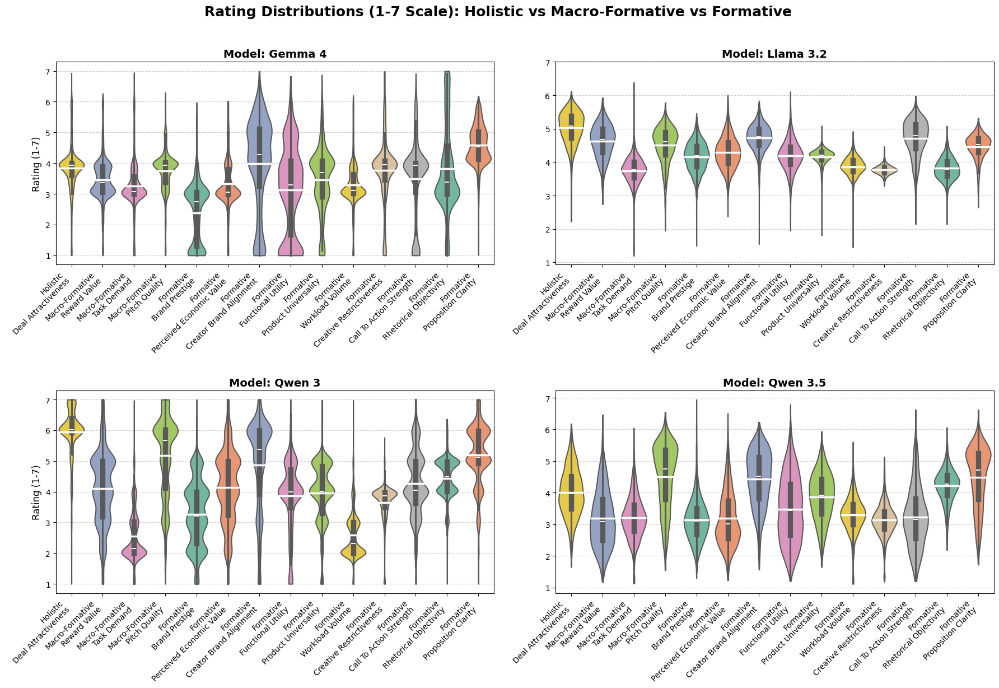

In [10]:
from src.general_analysis.visualisations import plot_rating_distributions_by_architecture

rating_range = (1, 7)
plot_rating_distributions_by_architecture(
    final_df, plot_order=plot_order, dim_map_clean=dim_map_clean, rating_range=rating_range)

## Multi-modality

### Standard multimodality

In [11]:
# Import the functions from your shared file
from src.general_analysis.visualisations import append_multimodality_flags, generate_multimodality_report

# 1. Process the dataframe (works for any dataset as long as you pass the right column)
final_df = append_multimodality_flags(final_df, logits_col='sorted_logits')

# 2. Generate and display the table
styled_stats = generate_multimodality_report(
    final_df, group_col='analysis_group_named')
display(styled_stats)

C:\Users\Wouter Barter\Documents\AI_thesis\src\general_analysis\visualisations.py:764: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['peak_count'] = compute_multimodality(logits_matrix)
C:\Users\Wouter Barter\Documents\AI_thesis\src\general_analysis\visualisations.py:765: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['is_multimodal'] = df['peak_count'] > 1


,Failure_Rate,Std_Dev,Total_Evaluations
analysis_group_named,,,
Qwen/Qwen3-4B-Instruct-2507_Holistic Naive_dbadc59142e9,73.32%,0.4424,"3,137"
Qwen/Qwen3-4B-Instruct-2507_Macro-Formative_38c4714f0e3a,21.73%,0.4124,"9,411"
Qwen/Qwen3-4B-Instruct-2507_Formative_1e1ff82a28e2,19.48%,0.3961,"31,370"
google/gemma-4-E2B-it_Formative_1e1ff82a28e2,16.59%,0.3720,"31,370"
meta-llama/Llama-3.2-3B-Instruct_Formative_1e1ff82a28e2,4.64%,0.2103,"31,370"
google/gemma-4-E2B-it_Holistic Naive_dbadc59142e9,2.93%,0.1687,"3,137"
meta-llama/Llama-3.2-3B-Instruct_Holistic Naive_dbadc59142e9,2.45%,0.1548,"3,137"
google/gemma-4-E2B-it_Macro-Formative_38c4714f0e3a,2.32%,0.1504,"9,411"
Qwen/Qwen3.5-4B_Formative_1e1ff82a28e2,1.91%,0.1369,"31,370"


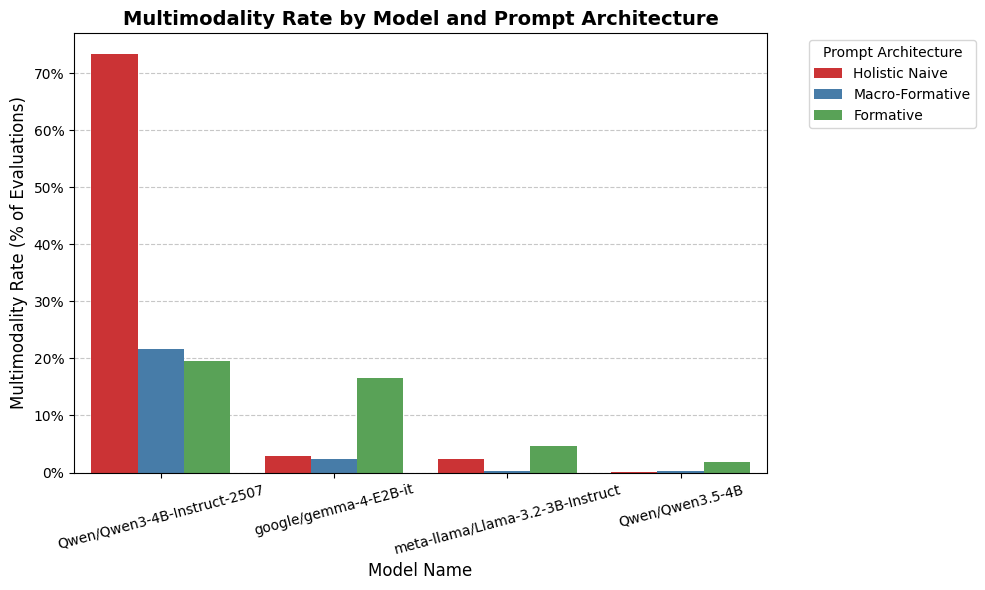

<Axes: title={'center': 'Multimodality Rate by Model and Prompt Architecture'}, xlabel='Model Name', ylabel='Multimodality Rate (% of Evaluations)'>

In [12]:
from src.general_analysis.visualisations import plot_multimodality_rates

# Pass the raw multimodal_stats variable we generated in the previous step
# (Before applying the .style.format() chaining)
plot_multimodality_rates(styled_stats.data, prompt_order=prompt_order)

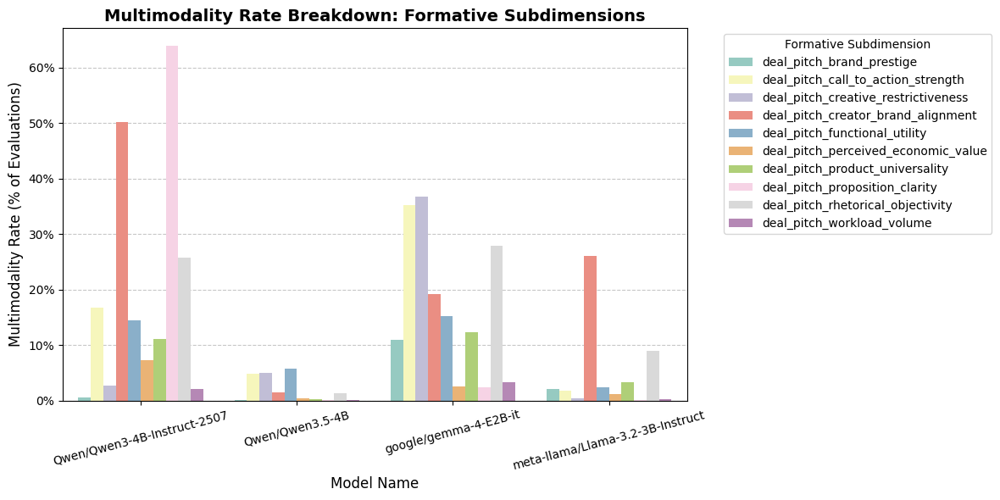

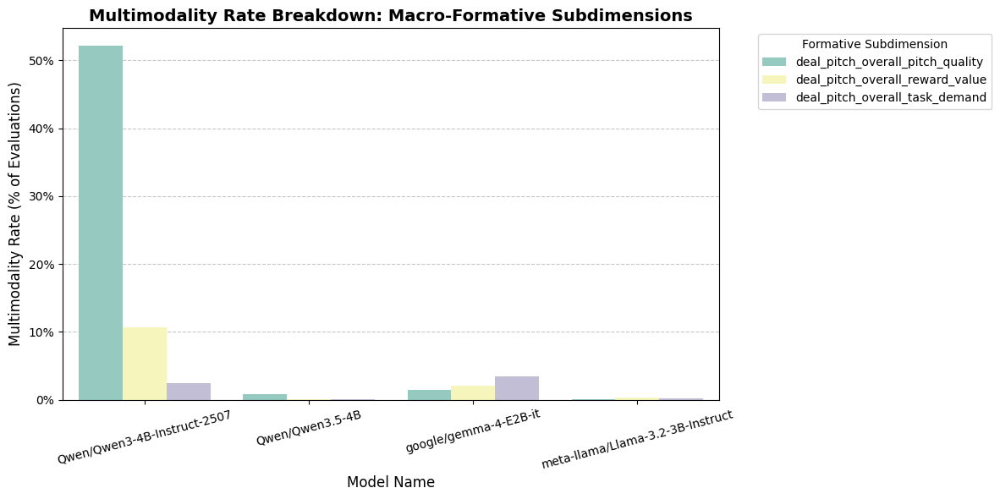

<Axes: title={'center': 'Multimodality Rate Breakdown: Macro-Formative Subdimensions'}, xlabel='Model Name', ylabel='Multimodality Rate (% of Evaluations)'>

In [13]:
from src.general_analysis.visualisations import plot_formative_multimodality_breakdown

# Render the subdimension drill-down
plot_formative_multimodality_breakdown(final_df, breakdown_col='Formative')
plot_formative_multimodality_breakdown(
    final_df, breakdown_col='Macro-Formative')


# Or save it directly
# plot_formative_multimodality_breakdown(final_df, save_path='figures/formative_multimodality_breakdown.png')

### Multi-modal severity metric

In [14]:
from src.general_analysis.visualisations import append_multimodality_severity, generate_multimodal_severity_report
final_df = append_multimodality_severity(final_df, logits_col='sorted_logits')
generate_multimodal_severity_report(final_df)

C:\Users\Wouter Barter\Documents\AI_thesis\src\general_analysis\visualisations.py:989: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['multimodal_severity_score'] = raw_severity / max_possible_severity
C:\Users\Wouter Barter\Documents\AI_thesis\src\general_analysis\visualisations.py:993: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['is_multimodal'] = df['multimodal_severity_score'] > 0.01


,Mean_Severity,Max_Severity,Total_Evaluations
analysis_group_named,,,
google/gemma-4-E2B-it_Formative_1e1ff82a28e2,1.66%,92.57%,"31,370"
meta-llama/Llama-3.2-3B-Instruct_Formative_1e1ff82a28e2,0.77%,44.98%,"31,370"
meta-llama/Llama-3.2-3B-Instruct_Holistic Naive_dbadc59142e9,0.45%,21.89%,"3,137"
google/gemma-4-E2B-it_Holistic Naive_dbadc59142e9,0.44%,44.75%,"3,137"
google/gemma-4-E2B-it_Macro-Formative_38c4714f0e3a,0.33%,65.52%,"9,411"
Qwen/Qwen3.5-4B_Formative_1e1ff82a28e2,0.32%,63.97%,"31,370"
Qwen/Qwen3-4B-Instruct-2507_Formative_1e1ff82a28e2,0.04%,36.28%,"31,370"
meta-llama/Llama-3.2-3B-Instruct_Macro-Formative_38c4714f0e3a,0.03%,35.87%,"9,411"
Qwen/Qwen3-4B-Instruct-2507_Macro-Formative_38c4714f0e3a,0.03%,32.76%,"9,411"


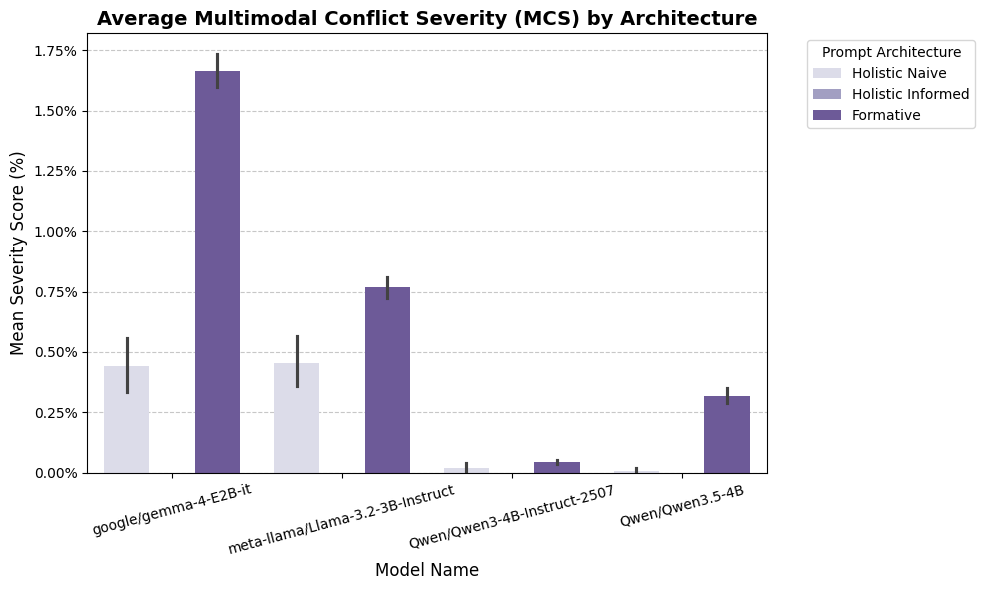

<Axes: title={'center': 'Average Multimodal Conflict Severity (MCS) by Architecture'}, xlabel='Model Name', ylabel='Mean Severity Score (%)'>

In [15]:
from src.general_analysis.visualisations import plot_severity_bar_chart
plot_severity_bar_chart(final_df)

## Verbosity bias (relationship between input length and rating)

In [16]:
from src.general_analysis.diagnostics import compute_verbosity_correlations
from src.general_analysis.visualisations import plot_formative_verbosity_breakdown
from src.general_analysis.visualisations import plot_verbosity_breakdown

### Ceiling effect/ effect per textual asset

We observe that there is a curve, characteristic for requirements and body word count. For the Gemma 4 and Qwen 3.5 we see that rating tends to increase until around 150 words, after which it flatlines. This is expected. When a text is very short, words can reliably increase the quality of a text since they add more information ("complex campaigns require sufficient token volume to define rules and reduce ambiguity"). At around 180 words, we see this initial 'verbosity reward' flatline, and even invert in some cases, where longer texts get penalized. This motivates our choice for computing the absolute Cohen's D over the lower and upper quartile. Cohen's D captures the change between two subsets of the data, controlling for the standard deviation. This last part is important, since the differences in how much of the scale each model uses is different. E.g., Llama has a very low standard deviation, and it moves up 0.8 points as word count increases. However, 0.8 is very large when the standard deviation is so low, leading to a large Cohen's D. 

In [17]:
final_df['dimension_name_clean'].unique()

array(['Formative\nBrand Prestige', 'Formative\nPerceived Economic Value',
       'Formative\nCreator Brand Alignment',
       'Formative\nFunctional Utility', 'Formative\nProduct Universality',
       'Formative\nWorkload Volume',
       'Formative\nCreative Restrictiveness',
       'Formative\nCall To Action Strength',
       'Formative\nRhetorical Objectivity',
       'Formative\nProposition Clarity', 'Macro-Formative\nReward Value',
       'Macro-Formative\nTask Demand', 'Macro-Formative\nPitch Quality',
       'Holistic\nDeal Attractiveness'], dtype=object)

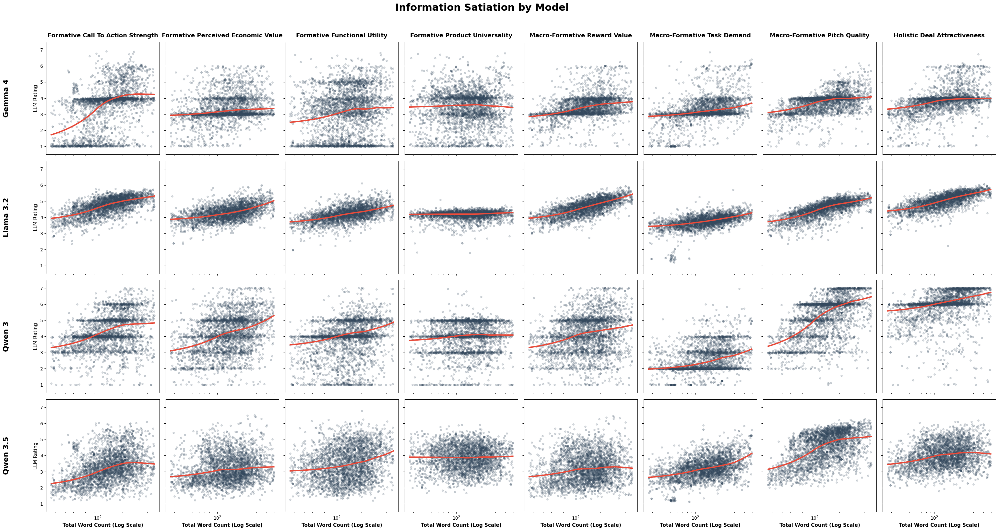

In [18]:
from src.general_analysis.visualisations import plot_verbosity_grid

models = final_df['model_name_clean'].unique()
dimensions = final_df['dimension_name_clean'].unique()[1:5]
dimensions = ['Formative\nCall To Action Strength',
              'Formative\nPerceived Economic Value',
              'Formative\nFunctional Utility',
              'Formative\nProduct Universality',
              'Macro-Formative\nReward Value',
              'Macro-Formative\nTask Demand',
              'Macro-Formative\nPitch Quality',
              'Holistic\nDeal Attractiveness'
              ]
plot_verbosity_grid(final_df, models=models, dimensions=dimensions, model_col='model_name_clean',
                    dim_col='dimension_name_clean',
                    x_col='raw_input_word_count',
                    y_col='mean_rating')

In [19]:
# from src.general_analysis.visualisations import plot_verbosity_grid

# models = final_df['model_name_clean'].unique()
# dimensions = final_df['dimension_name_clean'].unique()[1:5]
# dimensions = ['Formative\nCall To Action Strength',
#               'Formative\nPerceived Economic Value',
#               'Formative\nFunctional Utility',
#               'Formative\nProduct Universality',
#               'Macro-Formative\nReward Value',
#               'Macro-Formative\nTask Demand',
#               'Macro-Formative\nPitch Quality',
#               'Holistic\nDeal Attractiveness'
#               ]
# plot_verbosity_grid(final_df, models=models, dimensions=dimensions, model_col='model_name_clean',
#                     dim_col='dimension_name_clean',
#                     x_col='raw_input_word_count',
#                     y_col = 'normalized_entropy',
#                     y_min = -0.2, y_max = 1.2)

C:\Users\Wouter Barter\Documents\AI_thesis\src\general_analysis\visualisations.py:332: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(data=res_df, x='Text Section', y='Absolute Cohen\'s d', hue='Model',


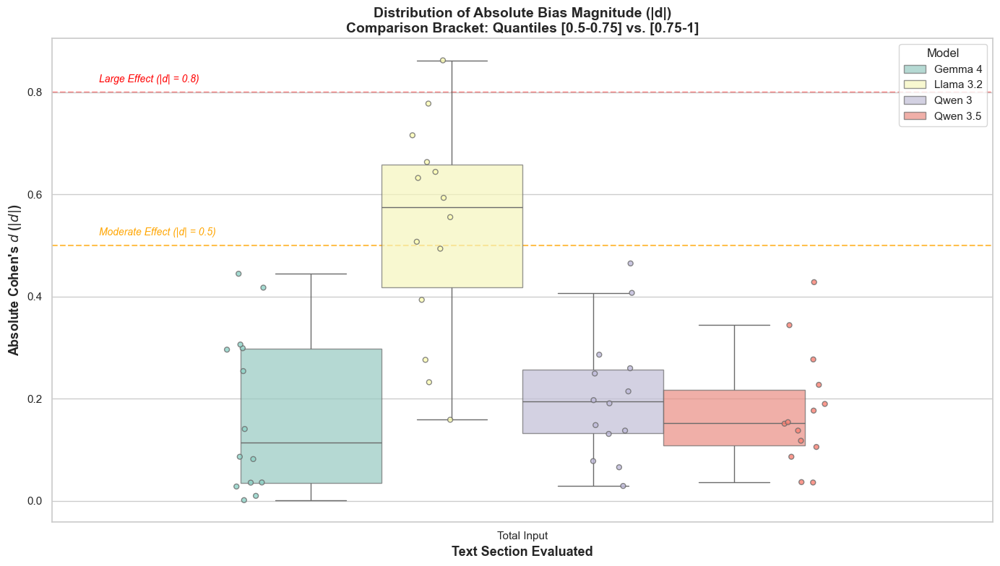

In [20]:
from src.general_analysis.visualisations import plot_absolute_bias_spread

sections = {
    'Total Input': 'raw_input_word_count'}

# res_df_upperquart = plot_absolute_bias_spread(final_df[final_df['prompt_name'] == 'Macro-Formative'], sections, p_lower=[
#     0.5, 0.75], p_upper=[0.75, 1])


res_df_upperquart = plot_absolute_bias_spread(final_df, sections, p_lower=[
    0.5, 0.75], p_upper=[0.75, 1])


# sections = {
#     'Total Input': 'raw_input_word_count',
#     'Deal Text (Body)': 'text_word_count',
#     'Requirements': 'requirements_word_count'
# }
# res_df = plot_absolute_bias_spread(final_df, sections, p_lower=[
#                                    0, 0.25], p_upper=[0.75, 1])

Isolating True Verbosity Bias via Mature Text Bracketing
*"In evaluating LLM length heuristics, it is critical to distinguish between 'construct-relevant verbosity' (the necessary resolution of information deficits) and 'heuristic verbosity bias' (the blind rewarding of token volume). Because dimensions such as 'Task Demand' and 'Proposition Clarity' inherently require textual specification, rating increases between short (Q1) and moderate (Q3) texts represent accurate semantic evaluation, not bias.

Therefore, to measure true construct-irrelevant verbosity bias, we isolated our final effect size calculations to the mature text bracket (Q3 vs. Q4). By evaluating texts that have already structurally satisfied the rubric, we test whether the model correctly flatlines its evaluation, or whether a residual length heuristic remains active."*

C:\Users\Wouter Barter\Documents\AI_thesis\src\general_analysis\visualisations.py:332: FutureWarning: Use "auto" to set automatic grayscale colors. From v0.14.0, "gray" will default to matplotlib's definition.
  sns.stripplot(data=res_df, x='Text Section', y='Absolute Cohen\'s d', hue='Model',


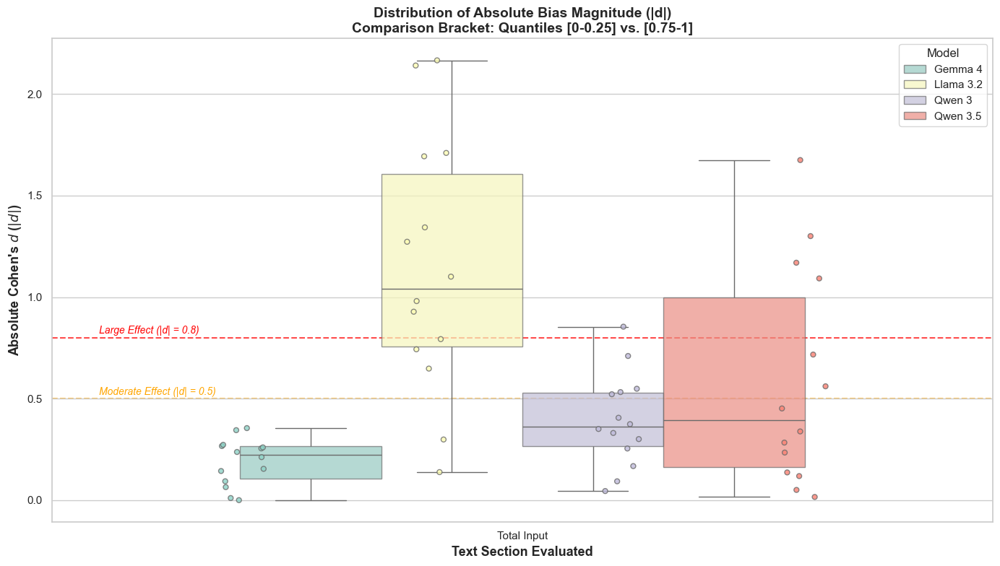

In [21]:
sections = {
    'Total Input': 'raw_input_word_count'}

# res_df_upperquart = plot_absolute_bias_spread(final_df[final_df['prompt_name'] == 'Macro-Formative'], sections, p_lower=[
#     0.5, 0.75], p_upper=[0.75, 1])


res_df_entropy = plot_absolute_bias_spread(final_df, sections, p_lower=[
    0, 0.25], p_upper=[0.75, 1], rating_col='normalized_entropy')

In [22]:
res_df_entropy

,Model,Dimension,Text Section,Absolute Cohen's d,Cohen's d
0,Gemma 4,Formative\nBrand Prestige,Total Input,0.000118,-0.000118
1,Gemma 4,Formative\nPerceived Economic Value,Total Input,0.064298,-0.064298
2,Gemma 4,Formative\nCreator Brand Alignment,Total Input,0.143617,0.143617
3,Gemma 4,Formative\nFunctional Utility,Total Input,0.010432,-0.010432
4,Gemma 4,Formative\nProduct Universality,Total Input,0.211995,-0.211995
5,Gemma 4,Formative\nWorkload Volume,Total Input,0.255009,0.255009
6,Gemma 4,Formative\nCreative Restrictiveness,Total Input,0.093177,-0.093177
7,Gemma 4,Formative\nCall To Action Strength,Total Input,0.344685,0.344685
8,Gemma 4,Formative\nRhetorical Objectivity,Total Input,0.354875,-0.354875
9,Gemma 4,Formative\nProposition Clarity,Total Input,0.259933,0.259933


## Entropy

### Distribution

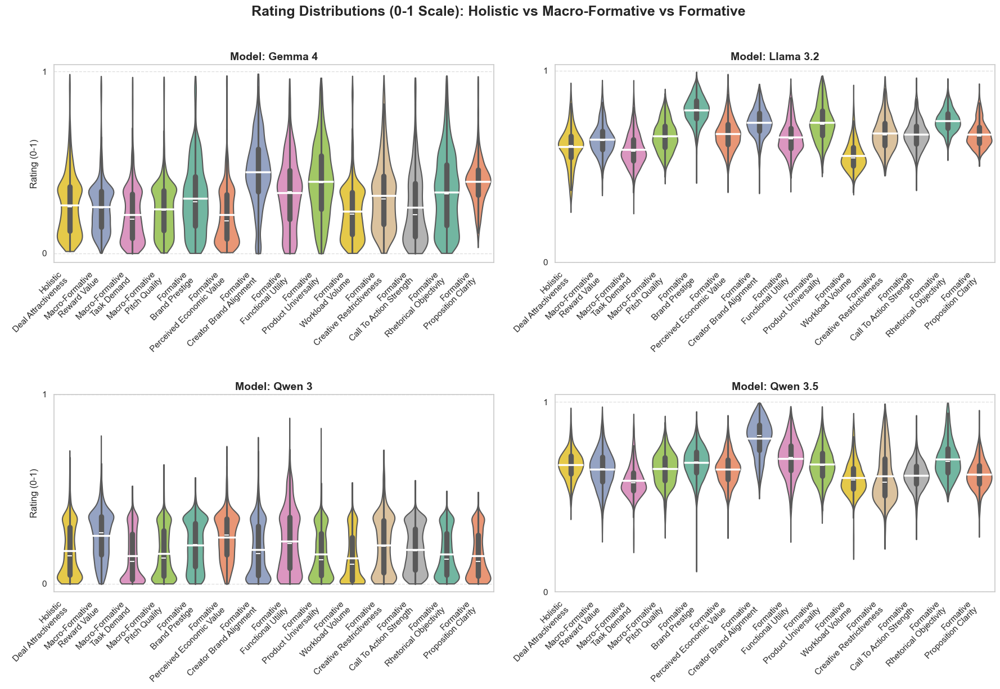

In [23]:
from src.general_analysis.visualisations import plot_rating_distributions_by_architecture

rating_range = (0, 1)
plot_rating_distributions_by_architecture(
    final_df, plot_order=plot_order, score_col='normalized_entropy', rating_range=(0, 1), dim_map_clean=dim_map_clean)

# Main Analysis: Regression

In [24]:
final_df['length_bucket'].value_counts()

length_bucket
1. Short           44296
2. Medium-Short    43848
3. Medium-Long     43792
4. Long            43736
Name: count, dtype: int64

In [25]:
CONTENT_TYPE_COL = 'macro_category'

CATEGORICALS = ['market_scope', CONTENT_TYPE_COL,
                'year_month', 'platform_strategy']

# CATEGORICALS = ['market_scope', CONTENT_TYPE_COL,
#                 'year_month', 'platform_strategy', 'length_bucket']

CATEGORICALS = ['market_scope', CONTENT_TYPE_COL,
                'year_month', 'platform_strategy', 'requirements_length_bucket', 'body_length_bucket']


CONTINUOUS = ['competitor_density']
BINARIES = ['strict_follower_requirement']
EXPERIMENTAL_GROUPS = ['model_name', 'prompt_name']

runner = create_regression_runner(
    target_col='apps_after_7_days',
    experimental_groups=EXPERIMENTAL_GROUPS,
    cluster_col='partner_id',
    model_type='negbin'
)

runner.run_baseline_model(
    df=og_df,
    cat_vars=CATEGORICALS,
    bin_vars=BINARIES,
    num_vars=CONTINUOUS,
    label="baseline"
)

✓ Baseline model fitted: 3139 observations, AIC=22479.65


In [26]:
CONTENT_TYPE_COL = 'macro_category'

CATEGORICALS = ['market_scope', CONTENT_TYPE_COL,
                'year_month', 'platform_strategy']

# CATEGORICALS = ['market_scope', CONTENT_TYPE_COL,
#                 'year_month', 'platform_strategy', 'length_bucket']

CATEGORICALS = ['market_scope', CONTENT_TYPE_COL,
                'year_month', 'platform_strategy', 'requirements_length_bucket', 'body_length_bucket']


CONTINUOUS = ['competitor_density']
# CONTINUOUS = ['competitor_density',
#               'log_requirements_word_count', 'log_text_word_count']


BINARIES = ['strict_follower_requirement']
EXPERIMENTAL_GROUPS = ['model_name', 'prompt_name']
# EXPERIMENTAL_GROUPS = ['analysis_group_clean']

runner = create_regression_runner(
    target_col='apps_after_7_days',  # Log-transformed target
    experimental_groups=EXPERIMENTAL_GROUPS,
    cluster_col='partner_id',
    model_type='negbin'
)

runner.run_baseline_model(
    df=og_df,
    cat_vars=CATEGORICALS,
    bin_vars=BINARIES,
    num_vars=CONTINUOUS,
    label="baseline"
)

✓ Baseline model fitted: 3139 observations, AIC=22479.65


## Mean

In [27]:
from src.general_analysis.diagnostics import collect_all_diagnostics, overview

predictor_names = ['z_mean_rating']

runner_mean.run_regression(df=final_df,
                           cat_vars=CATEGORICALS,
                           bin_vars=BINARIES,
                           num_vars=CONTINUOUS,
                           predictor_names=predictor_names)

runner_mean_summ = runner_mean.summarize().copy()

interactive_regression_results_selector(runner_mean.results)

Dropdown(description='Select option:', layout=Layout(width='400px'), options=('baseline', 'Qwen/Qwen3-4B-Instr…

<class 'statsmodels.iolib.summary.Summary'>
"""
                     NegativeBinomial Regression Results                      
==============================================================================
Dep. Variable:      apps_after_7_days   No. Observations:                 3139
Model:               NegativeBinomial   Df Residuals:                     3103
Method:                           MLE   Df Model:                           35
Date:                Wed, 13 May 2026   Pseudo R-squ.:                 0.05176
Time:                        13:08:08   Log-Likelihood:                -11203.
converged:                       True   LL-Null:                       -11814.
Covariance Type:              cluster   LLR p-value:                2.921e-234
==============================================================================================================
                                                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------------
const                                          2.4576      0.224     10.962      0.000       2.018       2.897
strict_follower_requirement                   -0.1760      0.059     -2.972      0.003      -0.292      -0.060
competitor_density                            -0.0435      0.007     -6.034      0.000      -0.058      -0.029
market_scope_Tier2_NLD_only                   -0.3662      0.067     -5.493      0.000      -0.497      -0.235
market_scope_Tier3_BEL_Only                   -1.2615      0.175     -7.195      0.000      -1.605      -0.918
market_scope_Tier4_Germany                    -1.6897      0.078    -21.778      0.000      -1.842      -1.538
macro_category_Beauty                          0.6244      0.191      3.265      0.001       0.249       1.000
macro_category_Digital Entertainment          -0.1445      0.204     -0.709      0.478      -0.544       0.255
macro_category_Dining & Hospitality            0.2471      0.194      1.272      0.204      -0.134       0.628
macro_category_Family & Parenting             -0.0765      0.220     -0.348      0.728      -0.509       0.356
macro_category_Fashion                         0.5487      0.205      2.675      0.008       0.146       0.951
macro_category_Home Cooking & CPG              0.3262      0.186      1.755      0.079      -0.038       0.691
macro_category_In-Person Experiences          -0.3261      0.237     -1.378      0.169      -0.791       0.138
macro_category_Lifestyle & Home                0.5466      0.198      2.763      0.006       0.158       0.935
macro_category_Tech & Niche                   -0.2678      0.261     -1.027      0.304      -0.779       0.244
macro_category_Uncategorized                  -0.0653      0.246     -0.266      0.790      -0.547       0.416
year_month_2025-06                             0.2299      0.110      2.098      0.036       0.015       0.445
year_month_2025-07                             0.4072      0.109      3.738      0.000       0.193       0.621
year_month_2025-08                             0.0979      0.118      0.829      0.408      -0.134       0.330
year_month_2025-09                             0.1874      0.110      1.705      0.089      -0.028       0.403
year_month_2025-10                             0.5962      0.114      5.217      0.000       0.372       0.820
year_month_2025-11                             0.5005      0.118      4.249      0.000       0.269       0.732
year_month_2025-12                             0.4932      0.157      3.142      0.002       0.185       0.801
year_month_2026-01                             0.4265      0.125      3.417      0.001       0.182       0.671
year_month_2026-02                             0.5670      0.127      4.452      0.000       0.317       0.817
year_month_2026-03                             1.0501      0.184      5.707      0.000       0.689       1.411
platform_strategy_IG_a

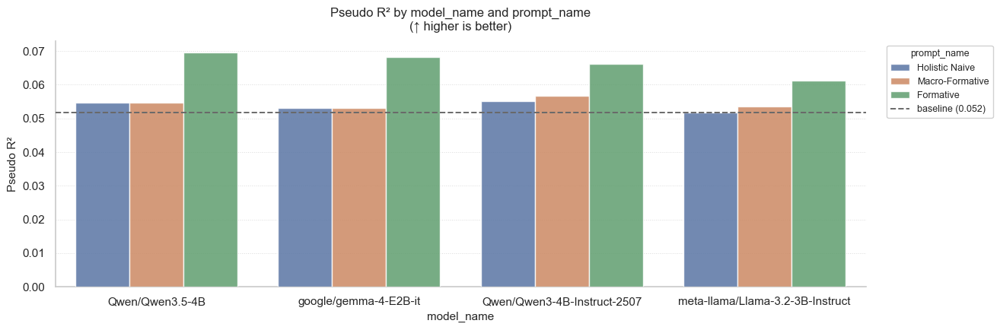

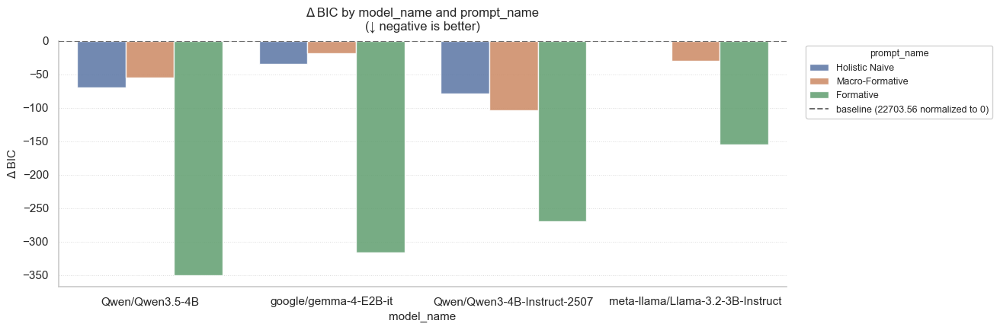

In [28]:
from src.general_analysis.visualisations import plot_metric_bars

plt_r2 = plot_metric_bars(runner=runner_mean,
                          metric='pseudo_r_squared',
                          model_col='model_name',
                          prompt_col='prompt_name', plot_order=prompt_order,
                          plot_delta=False)


plt_bic = plot_metric_bars(runner=runner_mean,
                           metric='bic',
                           model_col='model_name',
                           prompt_col='prompt_name', plot_order=prompt_order,
                           plot_delta=True)

In [29]:
# same API as FeedbackQA runner
runner_mean_summ

,model_name,prompt_name,label,nobs,r_squared,adj_r_squared,pseudo_r_squared,aic,bic,llf,condition_number
4,Qwen/Qwen3.5-4B,Formative,Qwen/Qwen3.5-4B Formative,3137,NaN,NaN,0.069573,22069.056635,22353.454679,-10987.528317,NaN
7,google/gemma-4-E2B-it,Formative,google/gemma-4-E2B-it Formative,3137,NaN,NaN,0.068126,22103.233034,22387.631078,-11004.616517,NaN
1,Qwen/Qwen3-4B-Instruct-2507,Formative,Qwen/Qwen3-4B-Instruct-2507 Formative,3137,NaN,NaN,0.066175,22149.321126,22433.719170,-11027.660563,NaN
10,meta-llama/Llama-3.2-3B-Instruct,Formative,meta-llama/Llama-3.2-3B-Instruct Formative,3137,NaN,NaN,0.061288,22264.737083,22549.135127,-11085.368541,NaN
3,Qwen/Qwen3-4B-Instruct-2507,Macro-Formative,Qwen/Qwen3-4B-Instruct-2507 Macro-Formative,3137,NaN,NaN,0.056752,22357.884920,22599.925808,-11138.942460,NaN
2,Qwen/Qwen3-4B-Instruct-2507,Holistic Naive,Qwen/Qwen3-4B-Instruct-2507 Holistic Naive,3137,NaN,NaN,0.055033,22394.485555,22624.424399,-11159.242778,NaN
5,Qwen/Qwen3.5-4B,Holistic Naive,Qwen/Qwen3.5-4B Holistic Naive,3137,NaN,NaN,0.054638,22403.810285,22633.749128,-11163.905142,NaN
6,Qwen/Qwen3.5-4B,Macro-Formative,Qwen/Qwen3.5-4B Macro-Formative,3137,NaN,NaN,0.054698,22406.398327,22648.439216,-11163.199164,NaN
12,meta-llama/Llama-3.2-3B-Instruct,Macro-Formative,meta-llama/Llama-3.2-3B-Instruct Macro-Formative,3137,NaN,NaN,0.053627,22431.686945,22673.727833,-11175.843472,NaN
8,google/gemma-4-E2B-it,Holistic Naive,google/gemma-4-E2B-it Holistic Naive,3137,NaN,NaN,0.053134,22439.321215,22669.260059,-11181.660607,NaN


## Mean + entropy

## Mode

In [30]:
predictor_names = ['z_mode_rating']

runner.run_regression(df=final_df,
                      cat_vars=CATEGORICALS,
                      bin_vars=BINARIES,
                      num_vars=CONTINUOUS,
                      predictor_names=predictor_names)

runner_mode_summ = runner.summarize().copy()

interactive_regression_results_selector(runner.results)

Dropdown(description='Select option:', layout=Layout(width='400px'), options=('baseline', 'Qwen/Qwen3-4B-Instr…

<class 'statsmodels.iolib.summary.Summary'>
"""
                     NegativeBinomial Regression Results                      
==============================================================================
Dep. Variable:      apps_after_7_days   No. Observations:                 3139
Model:               NegativeBinomial   Df Residuals:                     3103
Method:                           MLE   Df Model:                           35
Date:                Wed, 13 May 2026   Pseudo R-squ.:                 0.05176
Time:                        13:08:12   Log-Likelihood:                -11203.
converged:                       True   LL-Null:                       -11814.
Covariance Type:              cluster   LLR p-value:                2.921e-234
==============================================================================================================
                                                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------------
const                                          2.4576      0.224     10.962      0.000       2.018       2.897
strict_follower_requirement                   -0.1760      0.059     -2.972      0.003      -0.292      -0.060
competitor_density                            -0.0435      0.007     -6.034      0.000      -0.058      -0.029
market_scope_Tier2_NLD_only                   -0.3662      0.067     -5.493      0.000      -0.497      -0.235
market_scope_Tier3_BEL_Only                   -1.2615      0.175     -7.195      0.000      -1.605      -0.918
market_scope_Tier4_Germany                    -1.6897      0.078    -21.778      0.000      -1.842      -1.538
macro_category_Beauty                          0.6244      0.191      3.265      0.001       0.249       1.000
macro_category_Digital Entertainment          -0.1445      0.204     -0.709      0.478      -0.544       0.255
macro_category_Dining & Hospitality            0.2471      0.194      1.272      0.204      -0.134       0.628
macro_category_Family & Parenting             -0.0765      0.220     -0.348      0.728      -0.509       0.356
macro_category_Fashion                         0.5487      0.205      2.675      0.008       0.146       0.951
macro_category_Home Cooking & CPG              0.3262      0.186      1.755      0.079      -0.038       0.691
macro_category_In-Person Experiences          -0.3261      0.237     -1.378      0.169      -0.791       0.138
macro_category_Lifestyle & Home                0.5466      0.198      2.763      0.006       0.158       0.935
macro_category_Tech & Niche                   -0.2678      0.261     -1.027      0.304      -0.779       0.244
macro_category_Uncategorized                  -0.0653      0.246     -0.266      0.790      -0.547       0.416
year_month_2025-06                             0.2299      0.110      2.098      0.036       0.015       0.445
year_month_2025-07                             0.4072      0.109      3.738      0.000       0.193       0.621
year_month_2025-08                             0.0979      0.118      0.829      0.408      -0.134       0.330
year_month_2025-09                             0.1874      0.110      1.705      0.089      -0.028       0.403
year_month_2025-10                             0.5962      0.114      5.217      0.000       0.372       0.820
year_month_2025-11                             0.5005      0.118      4.249      0.000       0.269       0.732
year_month_2025-12                             0.4932      0.157      3.142      0.002       0.185       0.801
year_month_2026-01                             0.4265      0.125      3.417      0.001       0.182       0.671
year_month_2026-02                             0.5670      0.127      4.452      0.000       0.317       0.817
year_month_2026-03                             1.0501      0.184      5.707      0.000       0.689       1.411
platform_strategy_IG_a

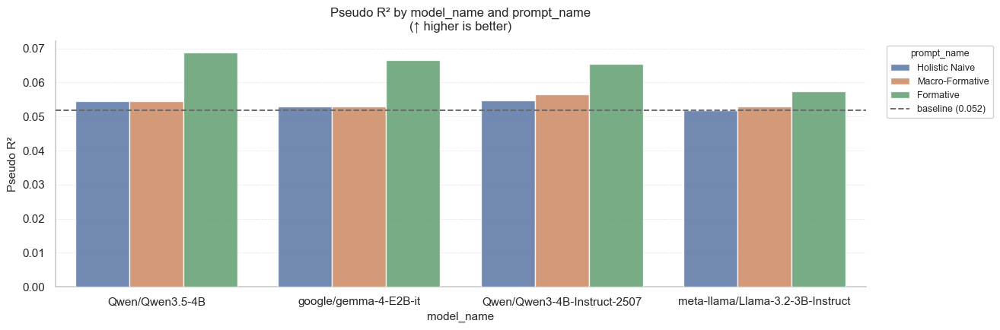

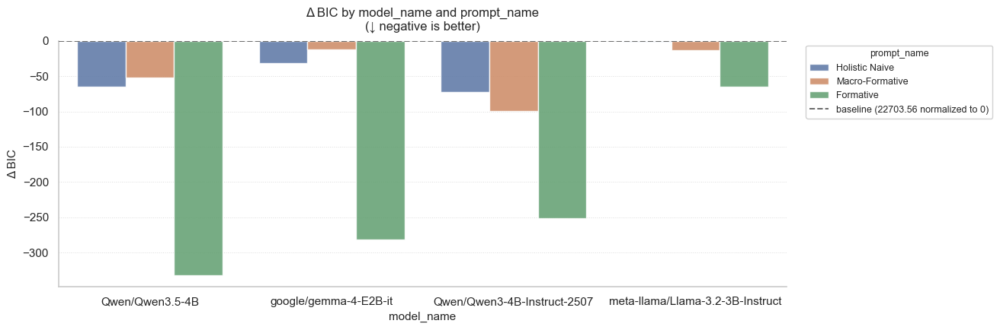

In [31]:
from src.general_analysis.visualisations import plot_metric_bars

plt_r2 = plot_metric_bars(runner=runner,
                          metric='pseudo_r_squared',
                          model_col='model_name',
                          prompt_col='prompt_name', plot_order=prompt_order,
                          plot_delta=False)


plt_bic = plot_metric_bars(runner=runner,
                           metric='bic',
                           model_col='model_name',
                           prompt_col='prompt_name', plot_order=prompt_order,
                           plot_delta=True)

# Mega model

In [32]:
from IPython.display import display, clear_output
import ipywidgets as widgets


prompts_to_include = final_df.prompt_id.unique().tolist()


mega_df = final_df


# 3. Create a single dummy group so the runner doesn't split the data
mega_df['mega_group'] = 'all_predictors'


# 1. Get all unique dimensions from your mega dataframe
all_variables = sorted(mega_df['analysis_group_full_clean'].unique().tolist())

# 2. Create the interactive multi-select widget
variable_selector = widgets.SelectMultiple(
    options=all_variables,
    value=all_variables,  # Default selects all of them (Kitchen Sink)
    rows=15,
    description='Variables:',
    layout=widgets.Layout(width='80%')
)

run_button = widgets.Button(
    description='Run Custom Model',
    button_style='success',
    icon='play'
)

output_area = widgets.Output()


def run_custom_regression(b):
    with output_area:
        clear_output(wait=True)
        selected_vars = list(variable_selector.value)

        if not selected_vars:
            print("⚠️ Please select at least one variable.")
            return

        print(
            f"🚀 Running OLS with {len(selected_vars)} selected dimensions...\n")

        # CORE MECHANIC: Filter the long dataframe to ONLY include selected variables
        # When the runner pivots this, the excluded variables simply won't exist!
        filtered_df = mega_df[mega_df['analysis_group_full_clean'].isin(
            selected_vars)].copy()

        # Re-initialize the runner
        custom_runner = create_regression_runner(
            target_col='apps_after_7_days',
            experimental_groups=['mega_group'],
            cluster_col='partner_id',
            model_type='negbin'
        )

        # Fit the model
        custom_runner.run_regression(
            df=filtered_df,
            cat_vars=CATEGORICALS,
            bin_vars=BINARIES,
            num_vars=CONTINUOUS,
            predictor_names=['z_mean_rating', 'normalized_entropy']
        )

        # Display the statsmodels summary table
        # The key is ('mega_group',) because of how groupby handles single-item lists

        # Safely attempt to fetch the result
        result = custom_runner.results.get('all_predictors')

        if result is not None:
            print(result.summary())
        else:
            print("🚨 MODEL FAILED TO CONVERGE.")
            print("Check for Perfect Multicollinearity. One of your binary variables (like friction) is likely all 0s, or a category has 0 observations.")
        # result = custom_runner.results["('all_predictors',)"]
        # if result:
        #     print(result.summary())
        # else:
        #     print("🚨 Model failed to converge. Check your variable mix.")


# 3. Render the UI
run_button.on_click(run_custom_regression)
display(variable_selector, run_button, output_area)

C:\Users\Wouter Barter\AppData\Local\Temp\ipykernel_25452\2605973351.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mega_df['mega_group'] = 'all_predictors'


SelectMultiple(description='Variables:', index=(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, …

Button(button_style='success', description='Run Custom Model', icon='play', style=ButtonStyle())

Output()

In [33]:
selected_vars = all_variables[:3]

filtered_df = mega_df[mega_df['analysis_group_full_clean'].isin(
    selected_vars)].copy()

# Re-initialize the runner
custom_runner = create_regression_runner(
    target_col='apps_after_7_days',
    experimental_groups=['mega_group'],
    cluster_col='partner_id',
    model_type='negbin'
)

# Fit the model
custom_runner.run_regression(
    df=filtered_df,
    cat_vars=CATEGORICALS,
    bin_vars=BINARIES,
    num_vars=CONTINUOUS,
    predictor_names=['z_mean_rating']
)

result = custom_runner.results.get("('all_predictors',)")

In [34]:
custom_runner.results

{'all_predictors': <statsmodels.discrete.discrete_model.NegativeBinomialResultsWrapper at 0x18794ad0c10>}

## Diff mean mode

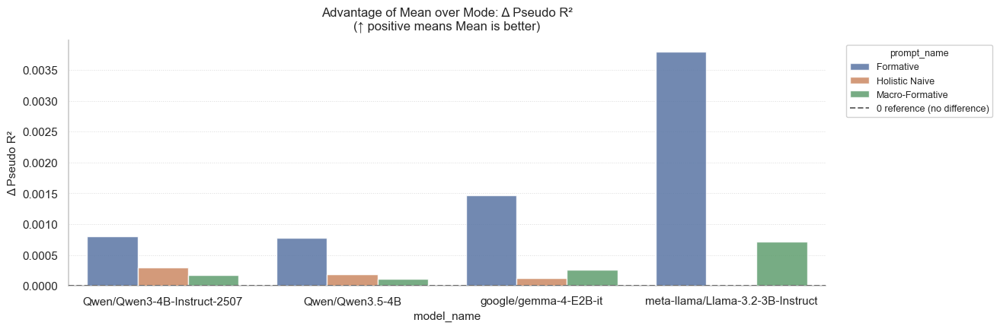

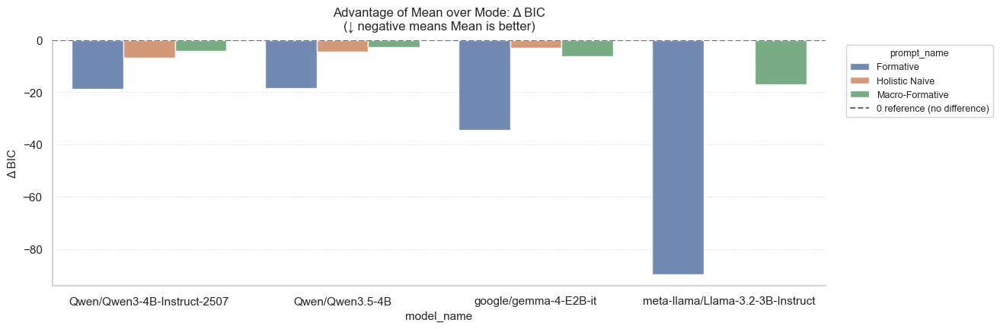

In [35]:
import matplotlib.pyplot as plt


# Assuming you have your two summarize() outputs:
# runner_mean_summ = runner_mean.summarize().copy()
# runner_mode_summ = runner_mode.summarize().copy()

# The columns used for grouping (update these to match your experimental_groups if needed)
model_col = "model_name"
prompt_col = "prompt_name"
group_cols = [model_col, prompt_col]
BASELINE_SENTINEL = "BASELINE"

# 1. Filter out the baseline model to strictly compare the LLM runs
mean_df = runner_mean_summ[runner_mean_summ[model_col]
                           != BASELINE_SENTINEL].set_index(group_cols)
mode_df = runner_mode_summ[runner_mode_summ[model_col]
                           != BASELINE_SENTINEL].set_index(group_cols)

# 2. Subtract Mode from Mean (Mean - Mode)
# This strictly aligns them by model and prompt before subtracting
delta_df = (mean_df[["bic", "pseudo_r_squared"]] -
            mode_df[["bic", "pseudo_r_squared"]]).reset_index()

# 3. Plot the Difference in Pseudo R2 (We want this to be Positive / higher)
fig_r2 = plot_metric_bars(
    df=delta_df,
    metric="pseudo_r_squared",
    model_col=model_col,
    prompt_col=prompt_col,
    plot_delta=True  # Tells the function to plot a reference line at 0
)
fig_r2.axes[0].set_title(
    "Advantage of Mean over Mode: Δ Pseudo R²\n(↑ positive means Mean is better)", pad=10)
plt.show()

# 4. Plot the Difference in BIC (We want this to be Negative / lower)
fig_bic = plot_metric_bars(
    df=delta_df,
    metric="bic",
    model_col=model_col,
    prompt_col=prompt_col,
    plot_delta=True
)
fig_bic.axes[0].set_title(
    "Advantage of Mean over Mode: Δ BIC\n(↓ negative means Mean is better)", pad=10)
plt.show()

## Including entropy

In [36]:
predictor_names = ['z_mean_rating', 'normalized_entropy']

runner.run_regression(df=final_df,
                      cat_vars=CATEGORICALS,
                      bin_vars=BINARIES,
                      num_vars=CONTINUOUS,
                      predictor_names=predictor_names)

runner_entr_summ = runner.summarize().copy()


interactive_regression_results_selector(runner.results)

Dropdown(description='Select option:', layout=Layout(width='400px'), options=('baseline', 'Qwen/Qwen3-4B-Instr…

<class 'statsmodels.iolib.summary.Summary'>
"""
                     NegativeBinomial Regression Results                      
==============================================================================
Dep. Variable:      apps_after_7_days   No. Observations:                 3139
Model:               NegativeBinomial   Df Residuals:                     3103
Method:                           MLE   Df Model:                           35
Date:                Wed, 13 May 2026   Pseudo R-squ.:                 0.05176
Time:                        13:08:18   Log-Likelihood:                -11203.
converged:                       True   LL-Null:                       -11814.
Covariance Type:              cluster   LLR p-value:                2.921e-234
==============================================================================================================
                                                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------------
const                                          2.4576      0.224     10.962      0.000       2.018       2.897
strict_follower_requirement                   -0.1760      0.059     -2.972      0.003      -0.292      -0.060
competitor_density                            -0.0435      0.007     -6.034      0.000      -0.058      -0.029
market_scope_Tier2_NLD_only                   -0.3662      0.067     -5.493      0.000      -0.497      -0.235
market_scope_Tier3_BEL_Only                   -1.2615      0.175     -7.195      0.000      -1.605      -0.918
market_scope_Tier4_Germany                    -1.6897      0.078    -21.778      0.000      -1.842      -1.538
macro_category_Beauty                          0.6244      0.191      3.265      0.001       0.249       1.000
macro_category_Digital Entertainment          -0.1445      0.204     -0.709      0.478      -0.544       0.255
macro_category_Dining & Hospitality            0.2471      0.194      1.272      0.204      -0.134       0.628
macro_category_Family & Parenting             -0.0765      0.220     -0.348      0.728      -0.509       0.356
macro_category_Fashion                         0.5487      0.205      2.675      0.008       0.146       0.951
macro_category_Home Cooking & CPG              0.3262      0.186      1.755      0.079      -0.038       0.691
macro_category_In-Person Experiences          -0.3261      0.237     -1.378      0.169      -0.791       0.138
macro_category_Lifestyle & Home                0.5466      0.198      2.763      0.006       0.158       0.935
macro_category_Tech & Niche                   -0.2678      0.261     -1.027      0.304      -0.779       0.244
macro_category_Uncategorized                  -0.0653      0.246     -0.266      0.790      -0.547       0.416
year_month_2025-06                             0.2299      0.110      2.098      0.036       0.015       0.445
year_month_2025-07                             0.4072      0.109      3.738      0.000       0.193       0.621
year_month_2025-08                             0.0979      0.118      0.829      0.408      -0.134       0.330
year_month_2025-09                             0.1874      0.110      1.705      0.089      -0.028       0.403
year_month_2025-10                             0.5962      0.114      5.217      0.000       0.372       0.820
year_month_2025-11                             0.5005      0.118      4.249      0.000       0.269       0.732
year_month_2025-12                             0.4932      0.157      3.142      0.002       0.185       0.801
year_month_2026-01                             0.4265      0.125      3.417      0.001       0.182       0.671
year_month_2026-02                             0.5670      0.127      4.452      0.000       0.317       0.817
year_month_2026-03                             1.0501      0.184      5.707      0.000       0.689       1.411
platform_strategy_IG_a

In [37]:
import pandas as pd

# 1. Use qcut to create 4 buckets with an EQUAL number of observations
labels = ['1. Low (Bottom 25%)', '2. Med-Low (25-50%)',
          '3. Med-High (50-75%)', '4. High (Top 25%)']

final_df['entropy_bucket'] = pd.qcut(
    final_df['normalized_entropy'],
    q=4,
    labels=labels
)

# 2. Group by model, prompt, and bucket, then calculate the mean apps and count
entropy_analysis = final_df.groupby(['model_name', 'dimension_name_clean', 'entropy_bucket'], observed=True).agg(
    mean_apps=('apps_after_7_days', 'mean'),
    # This should now be roughly equal across all buckets!
    deal_count=('apps_after_7_days', 'count')
).reset_index()

# 3. Pivot the table so buckets are columns
entropy_pivot = entropy_analysis.pivot(
    index=['model_name', 'dimension_name_clean'],
    columns='entropy_bucket',
    values='mean_apps'
)

# 4. Add the Drop-off metric
if '1. Low (Bottom 25%)' in entropy_pivot.columns and '4. High (Top 25%)' in entropy_pivot.columns:
    entropy_pivot['Drop-off (Low to High)'] = entropy_pivot['4. High (Top 25%)'] - \
        entropy_pivot['1. Low (Bottom 25%)']

display(entropy_pivot.round(2))

# Optional: Print the exact entropy thresholds chosen by qcut so you know what "High" actually means
print("\nEntropy Thresholds for the Buckets:")
print(pd.qcut(final_df['normalized_entropy'], q=4).cat.categories)

C:\Users\Wouter Barter\AppData\Local\Temp\ipykernel_25452\3662260610.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_df['entropy_bucket'] = pd.qcut(


entropy_bucket                                                        1. Low (Bottom 25%)  \
model_name                       dimension_name_clean                                       
Qwen/Qwen3-4B-Instruct-2507      Formative\nBrand Prestige                          16.11   
                                 Formative\nCall To Action Strength                 16.73   
                                 Formative\nCreative Restrictiveness                16.49   
                                 Formative\nCreator Brand Alignment                 16.36   
                                 Formative\nFunctional Utility                      17.19   
                                 Formative\nPerceived Economic Value                16.35   
                                 Formative\nProduct Universality                    16.39   
                                 Formative\nProposition Clarity                     15.41   
                                 Formative\nRhetorical Objectivity                  15.48   
                                 Formative\nWorkload Volume                         15.72   
                                 Holistic\nDeal Attractiveness                      16.46   
                                 Macro-Formative\nPitch Quality                     16.28   
                                 Macro-Formative\nReward Value                      16.45   
                                 Macro-Formative\nTask Demand                       16.16   
Qwen/Qwen3.5-4B                  Formative\nBrand Prestige                           8.00   
                                 Formative\nCall To Action Strength                   NaN   
                                 Formative\nCreative Restrictiveness                  NaN   
                                 Formative\nCreator Brand Alignment                   NaN   
                                 Formative\nFunctional Utility                        NaN   
                                 Formative\nPerceived Economic Value                  NaN   
                                 Formative\nProduct Universality                      NaN   
                                 Formative\nProposition Clarity                       NaN   
                                 Formative\nRhetorical Objectivity                    NaN   
                                 Formative\nWorkload Volume                         19.58   
                                 Holistic\nDeal Attractiveness                        NaN   
                                 Macro-Formative\nPitch Quality                       NaN   
                                 Macro-Formative\nReward Value                        NaN   
                                 Macro-Formative\nTask Demand                       28.00   
google/gemma-4-E2B-it            Formative\nBrand Prestige                          16.64   
                                 Formative\nCall To Action Strength                 15.50   
                                 Formative\nCreative Restrictiveness                17.68   
                                 Formative\nCreator Brand Alignment                 14.83   
                                 Formative\nFunctional Utility                      16.49   
                                 Formative\nPerceived Economic Value                16.63   
                                 Formative\nProduct Universality                    16.45   
                                 Formative\nProposition Clarity                     17.61   
                                 Formative\nRhetorical Objectivity                  17.08   
                                 Formative\nWorkload Volume                         16.63   
                                 Holistic\nDeal Attractiveness                      16.92   
                                 Macro-Formative\nPitch Quality                     16.47   
                                 Macro-Formative\nReward Value                      16.66   
 


Entropy Thresholds for the Buckets:
IntervalIndex([(-0.0009999361, 0.228], (0.228, 0.516], (0.516, 0.664],
               (0.664, 0.996]],
              dtype='interval[float64, right]')


"A quantile analysis of Normalized Entropy reveals that capable models successfully capture real-world cognitive friction. For models like Gemma 4, moving from the lowest to highest quartile of textual ambiguity resulted in strict application penalties across formative dimensions, such as a -6.50 drop-off for Proposition Clarity. Similarly, Qwen 3.5 successfully localized this risk aversion to structural requirements, showing a -14.39 application penalty when Task Demands were highly ambiguous. Conversely, Llama 3.2 exhibited inverted, positive correlations (e.g., +12.18 for Clarity), indicating its internal entropy is heavily confounded with global document length/complexity rather than true semantic ambiguity, further invalidating its construct validity."

## Including Multimodality severity

In [38]:
predictor_names = ['z_mean_rating', 'multimodal_severity_score']

runner.run_regression(df=final_df,
                      cat_vars=CATEGORICALS,
                      bin_vars=BINARIES,
                      num_vars=CONTINUOUS,
                      predictor_names=predictor_names)

runner_entr_summ = runner.summarize().copy()


interactive_regression_results_selector(runner.results)

c:\Users\Wouter Barter\Documents\AI_thesis\venv312\Lib\site-packages\statsmodels\base\model.py:595: HessianInversionWarning: Inverting hessian failed, no bse or cov_params available
  warnings.warn('Inverting hessian failed, no bse or cov_params '


Dropdown(description='Select option:', layout=Layout(width='400px'), options=('baseline', 'Qwen/Qwen3-4B-Instr…

<class 'statsmodels.iolib.summary.Summary'>
"""
                     NegativeBinomial Regression Results                      
==============================================================================
Dep. Variable:      apps_after_7_days   No. Observations:                 3139
Model:               NegativeBinomial   Df Residuals:                     3103
Method:                           MLE   Df Model:                           35
Date:                Wed, 13 May 2026   Pseudo R-squ.:                 0.05176
Time:                        13:08:25   Log-Likelihood:                -11203.
converged:                       True   LL-Null:                       -11814.
Covariance Type:              cluster   LLR p-value:                2.921e-234
==============================================================================================================
                                                 coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------------
const                                          2.4576      0.224     10.962      0.000       2.018       2.897
strict_follower_requirement                   -0.1760      0.059     -2.972      0.003      -0.292      -0.060
competitor_density                            -0.0435      0.007     -6.034      0.000      -0.058      -0.029
market_scope_Tier2_NLD_only                   -0.3662      0.067     -5.493      0.000      -0.497      -0.235
market_scope_Tier3_BEL_Only                   -1.2615      0.175     -7.195      0.000      -1.605      -0.918
market_scope_Tier4_Germany                    -1.6897      0.078    -21.778      0.000      -1.842      -1.538
macro_category_Beauty                          0.6244      0.191      3.265      0.001       0.249       1.000
macro_category_Digital Entertainment          -0.1445      0.204     -0.709      0.478      -0.544       0.255
macro_category_Dining & Hospitality            0.2471      0.194      1.272      0.204      -0.134       0.628
macro_category_Family & Parenting             -0.0765      0.220     -0.348      0.728      -0.509       0.356
macro_category_Fashion                         0.5487      0.205      2.675      0.008       0.146       0.951
macro_category_Home Cooking & CPG              0.3262      0.186      1.755      0.079      -0.038       0.691
macro_category_In-Person Experiences          -0.3261      0.237     -1.378      0.169      -0.791       0.138
macro_category_Lifestyle & Home                0.5466      0.198      2.763      0.006       0.158       0.935
macro_category_Tech & Niche                   -0.2678      0.261     -1.027      0.304      -0.779       0.244
macro_category_Uncategorized                  -0.0653      0.246     -0.266      0.790      -0.547       0.416
year_month_2025-06                             0.2299      0.110      2.098      0.036       0.015       0.445
year_month_2025-07                             0.4072      0.109      3.738      0.000       0.193       0.621
year_month_2025-08                             0.0979      0.118      0.829      0.408      -0.134       0.330
year_month_2025-09                             0.1874      0.110      1.705      0.089      -0.028       0.403
year_month_2025-10                             0.5962      0.114      5.217      0.000       0.372       0.820
year_month_2025-11                             0.5005      0.118      4.249      0.000       0.269       0.732
year_month_2025-12                             0.4932      0.157      3.142      0.002       0.185       0.801
year_month_2026-01                             0.4265      0.125      3.417      0.001       0.182       0.671
year_month_2026-02                             0.5670      0.127      4.452      0.000       0.317       0.817
year_month_2026-03                             1.0501      0.184      5.707      0.000       0.689       1.411
platform_strategy_IG_a

# Secondary analysis: Verbosity Bias Regression

In [39]:
CONTENT_TYPE_COL = 'macro_category'

CATEGORICALS = ['market_scope', CONTENT_TYPE_COL,
                'year_month', 'platform_strategy']
CONTINUOUS = ['competitor_density', 'apps_after_7_days']

BINARIES = ['strict_follower_requirement']
EXPERIMENTAL_GROUPS = ['model_name', 'prompt_id']
EXPERIMENTAL_GROUPS = ['analysis_group']

runner = create_regression_runner(
    target_col='raw_input_word_count',  # Log-transformed target
    experimental_groups=EXPERIMENTAL_GROUPS,
    cluster_col='partner_id',
    model_type='negbin'
)

runner.run_baseline_model(
    df=og_df,
    cat_vars=CATEGORICALS,
    bin_vars=BINARIES,
    num_vars=CONTINUOUS,
    label="baseline"
)

predictor_names = ['z_mean_rating']

runner.run_regression(df=final_df,
                      cat_vars=CATEGORICALS,
                      bin_vars=BINARIES,
                      num_vars=CONTINUOUS,
                      predictor_names=predictor_names)

interactive_regression_results_selector(runner.results)

✓ Baseline model fitted: 3139 observations, AIC=36853.50


c:\Users\Wouter Barter\Documents\AI_thesis\venv312\Lib\site-packages\statsmodels\discrete\discrete_model.py:3379: RuntimeWarning: divide by zero encountered in log
  llf = coeff + size*np.log(prob) + endog*np.log(1-prob)


Dropdown(description='Select option:', layout=Layout(width='400px'), options=('baseline', 'Qwen/Qwen3-4B-Instr…

<class 'statsmodels.iolib.summary.Summary'>
"""
                      NegativeBinomial Regression Results                       
================================================================================
Dep. Variable:     raw_input_word_count   No. Observations:                 3139
Model:                 NegativeBinomial   Df Residuals:                     3108
Method:                             MLE   Df Model:                           30
Date:                  Wed, 13 May 2026   Pseudo R-squ.:                 0.01097
Time:                          13:08:28   Log-Likelihood:                -18395.
converged:                         True   LL-Null:                       -18599.
Covariance Type:                cluster   LLR p-value:                 6.645e-68
========================================================================================================
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------
const                                    5.3613      0.128     42.029      0.000       5.111       5.612
strict_follower_requirement             -0.0252      0.043     -0.587      0.557      -0.109       0.059
competitor_density                      -0.0108      0.008     -1.345      0.179      -0.027       0.005
apps_after_7_days                       -0.0010      0.001     -1.168      0.243      -0.003       0.001
market_scope_Tier2_NLD_only             -0.1216      0.049     -2.498      0.013      -0.217      -0.026
market_scope_Tier3_BEL_Only             -0.3706      0.131     -2.834      0.005      -0.627      -0.114
market_scope_Tier4_Germany              -0.1995      0.053     -3.746      0.000      -0.304      -0.095
macro_category_Beauty                    0.2495      0.091      2.733      0.006       0.070       0.429
macro_category_Digital Entertainment     0.0392      0.085      0.459      0.646      -0.128       0.206
macro_category_Dining & Hospitality     -0.1394      0.088     -1.579      0.115      -0.313       0.034
macro_category_Family & Parenting        0.2420      0.124      1.946      0.052      -0.002       0.486
macro_category_Fashion                  -0.0385      0.089     -0.433      0.665      -0.213       0.136
macro_category_Home Cooking & CPG        0.1702      0.079      2.149      0.032       0.015       0.326
macro_category_In-Person Experiences     0.0637      0.103      0.617      0.537      -0.139       0.266
macro_category_Lifestyle & Home         -0.0105      0.103     -0.102      0.919      -0.213       0.192
macro_category_Tech & Niche              0.1793      0.131      1.366      0.172      -0.078       0.437
macro_category_Uncategorized            -0.0761      0.104     -0.732      0.464      -0.280       0.128
year_month_2025-06                       0.0685      0.062      1.095      0.274      -0.054       0.191
year_month_2025-07                       0.0797      0.071      1.123      0.262      -0.060       0.219
year_month_2025-08                       0.1149      0.086      1.340      0.180      -0.053       0.283
year_month_2025-09                       0.1761      0.073      2.426      0.015       0.034       0.319
year_month_2025-10                       0.1157      0.073      1.576      0.115      -0.028       0.260
year_month_2025-11                       0.0306      0.072      0.422      0.673      -0.112       0.173
year_month_2025-12                       0.0436      0.096      0.454      0.650      -0.145       0.232
year_month_2026-01                       0.1302      0.075      1.729      0.084      -0.018       0.278
year_month_2026-02                       0.2670      0.077      3.481      0.001       0.117       0.417
year_month_2026-03                       0.3666      0.102      3.586      0.000       0.166       0.567
platform_strategy_IG_and_TikTok         -0.2501      0.090     -2.766    

# Entropy regression

In [40]:
final_df['entropy_mean_rating_interaction'] = final_df['mean_rating'] * \
    final_df['normalized_entropy']

C:\Users\Wouter Barter\AppData\Local\Temp\ipykernel_25452\1861070308.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_df['entropy_mean_rating_interaction'] = final_df['mean_rating'] * \


In [41]:
CONTENT_TYPE_COL = 'macro_category'

CATEGORICALS = ['market_scope', CONTENT_TYPE_COL,
                'year_month', 'platform_strategy']
CONTINUOUS = ['competitor_density']


BINARIES = ['strict_follower_requirement']
EXPERIMENTAL_GROUPS = ['model_name', 'prompt_id']
EXPERIMENTAL_GROUPS = ['analysis_group']

runner = create_regression_runner(
    target_col='apps_after_7_days',  # Log-transformed target
    experimental_groups=EXPERIMENTAL_GROUPS,
    cluster_col='partner_id',
    model_type='negbin'
)

runner.run_baseline_model(
    df=og_df,
    cat_vars=CATEGORICALS,
    bin_vars=BINARIES,
    num_vars=CONTINUOUS,
    label="baseline"
)

predictor_names = ['normalized_entropy'
                   ]
runner.run_regression(df=final_df,
                      cat_vars=CATEGORICALS,
                      bin_vars=BINARIES,
                      num_vars=CONTINUOUS,
                      predictor_names=predictor_names)

interactive_regression_results_selector(runner.results)

✓ Baseline model fitted: 3139 observations, AIC=22474.02


Dropdown(description='Select option:', layout=Layout(width='400px'), options=('baseline', 'Qwen/Qwen3-4B-Instr…

<class 'statsmodels.iolib.summary.Summary'>
"""
                     NegativeBinomial Regression Results                      
==============================================================================
Dep. Variable:      apps_after_7_days   No. Observations:                 3139
Model:               NegativeBinomial   Df Residuals:                     3109
Method:                           MLE   Df Model:                           29
Date:                Wed, 13 May 2026   Pseudo R-squ.:                 0.05149
Time:                        13:08:31   Log-Likelihood:                -11206.
converged:                       True   LL-Null:                       -11814.
Covariance Type:              cluster   LLR p-value:                1.060e-237
========================================================================================================
                                           coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------------
const                                    2.3457      0.216     10.840      0.000       1.921       2.770
strict_follower_requirement             -0.1759      0.059     -2.974      0.003      -0.292      -0.060
competitor_density                      -0.0428      0.007     -6.031      0.000      -0.057      -0.029
market_scope_Tier2_NLD_only             -0.3608      0.066     -5.485      0.000      -0.490      -0.232
market_scope_Tier3_BEL_Only             -1.2447      0.173     -7.203      0.000      -1.584      -0.906
market_scope_Tier4_Germany              -1.6774      0.079    -21.334      0.000      -1.832      -1.523
macro_category_Beauty                    0.6203      0.190      3.267      0.001       0.248       0.993
macro_category_Digital Entertainment    -0.1422      0.202     -0.703      0.482      -0.539       0.255
macro_category_Dining & Hospitality      0.2615      0.195      1.344      0.179      -0.120       0.643
macro_category_Family & Parenting       -0.0711      0.219     -0.325      0.746      -0.501       0.359
macro_category_Fashion                   0.5617      0.204      2.750      0.006       0.161       0.962
macro_category_Home Cooking & CPG        0.3249      0.186      1.748      0.081      -0.040       0.690
macro_category_In-Person Experiences    -0.3182      0.241     -1.321      0.187      -0.791       0.154
macro_category_Lifestyle & Home          0.5633      0.200      2.819      0.005       0.171       0.955
macro_category_Tech & Niche             -0.2445      0.265     -0.924      0.356      -0.764       0.275
macro_category_Uncategorized            -0.0539      0.242     -0.223      0.823      -0.528       0.420
year_month_2025-06                       0.2262      0.109      2.066      0.039       0.011       0.441
year_month_2025-07                       0.4002      0.109      3.689      0.000       0.187       0.613
year_month_2025-08                       0.0845      0.118      0.719      0.473      -0.146       0.315
year_month_2025-09                       0.1788      0.110      1.626      0.104      -0.037       0.395
year_month_2025-10                       0.5857      0.115      5.115      0.000       0.361       0.810
year_month_2025-11                       0.5005      0.118      4.236      0.000       0.269       0.732
year_month_2025-12                       0.4826      0.155      3.118      0.002       0.179       0.786
year_month_2026-01                       0.4126      0.125      3.296      0.001       0.167       0.658
year_month_2026-02                       0.5450      0.127      4.292      0.000       0.296       0.794
year_month_2026-03                       1.0061      0.182      5.535      0.000       0.650       1.363
platform_strategy_IG_and_TikTok          0.3213      0.126      2.558      0.011       0.075       0.568
platform_strategy_Instagram_Only         0.3206      0.138      2.325      0.020       0.05

In [42]:
final_df.groupby('analysis_group_full')[
    ['normalized_entropy', 'mean_rating']].corr()

normalized_entropy  \
analysis_group_full                                                                         
Qwen/Qwen3-4B-Instruct-2507_1e1ff82a28e2_deal_p... normalized_entropy            1.000000   
                                                   mean_rating                  -0.041675   
Qwen/Qwen3-4B-Instruct-2507_1e1ff82a28e2_deal_p... normalized_entropy            1.000000   
                                                   mean_rating                  -0.128655   
Qwen/Qwen3-4B-Instruct-2507_1e1ff82a28e2_deal_p... normalized_entropy            1.000000   
...                                                                                   ...   
meta-llama/Llama-3.2-3B-Instruct_38c4714f0e3a_d... mean_rating                  -0.643085   
meta-llama/Llama-3.2-3B-Instruct_38c4714f0e3a_d... normalized_entropy            1.000000   
                                                   mean_rating                  -0.136185   
meta-llama/Llama-3.2-3B-Instruct_dbadc59142e9_d... normalized_entropy            1.000000   
                                                   mean_rating                  -0.840818   

                                                                       mean_rating  
analysis_group_full                                                                 
Qwen/Qwen3-4B-Instruct-2507_1e1ff82a28e2_deal_p... normalized_entropy    -0.041675  
                                                   mean_rating            1.000000  
Qwen/Qwen3-4B-Instruct-2507_1e1ff82a28e2_deal_p... normalized_entropy    -0.128655  
                                                   mean_rating            1.000000  
Qwen/Qwen3-4B-Instruct-2507_1e1ff82a28e2_deal_p... normalized_entropy    -0.307909  
...                                                                            ...  
meta-llama/Llama-3.2-3B-Instruct_38c4714f0e3a_d... mean_rating            1.000000  
meta-llama/Llama-3.2-3B-Instruct_38c4714f0e3a_d... normalized_entropy    -0.136185  
                                                   mean_rating            1.000000  
meta-llama/Llama-3.2-3B-Instruct_dbadc59142e9_d... normalized_entropy    -0.840818  
                                                   mean_rating            1.000000  

[112 rows x 2 columns]

# Verbosity bias revisited

In [43]:
# import pandas as pd
# import numpy as np
# import matplotlib.pyplot as plt
# import seaborn as sns

In [44]:

# 2. Compute the mean expected_value per model, prompt, and length bucket
# (Assuming 'expected_value' is the column containing the 1-7 rating)
bucket_means = final_df.groupby(['analysis_group_clean', 'prompt_name', 'length_bucket'], observed=True)[
    'mean_rating'].mean().reset_index()

# 3. Pivot the table for easy reading
pivot_table = bucket_means.pivot(
    index=['analysis_group_clean', 'prompt_name'],
    columns='length_bucket',
    values='mean_rating'
)

# Optional: Add a "Delta" column to see exactly how much the score inflated from Short to Long
pivot_table['Delta (Long - Short)'] = pivot_table['4. Long'] - \
    pivot_table['3. Medium-Long']

display(pivot_table.round(2))

,length_bucket,1. Short,2. Medium-Short,3. Medium-Long,4. Long,Delta (Long - Short)
analysis_group_clean,prompt_name,,,,,
Gemma 4 Formative,Formative,3.28,3.51,3.62,3.68,0.06
Gemma 4 Holistic Naive,Holistic Naive,3.26,3.85,4.02,4.23,0.21
Gemma 4 Macro-Formative,Macro-Formative,2.97,3.47,3.65,3.88,0.23
Llama 3.2 Formative,Formative,3.97,4.17,4.29,4.43,0.13
Llama 3.2 Holistic Naive,Holistic Naive,4.54,4.92,5.20,5.44,0.24
Llama 3.2 Macro-Formative,Macro-Formative,3.82,4.22,4.46,4.69,0.23
Qwen 3 Formative,Formative,3.59,4.01,4.17,4.30,0.13
Qwen 3 Holistic Naive,Holistic Naive,5.48,5.91,6.09,6.26,0.17
Qwen 3 Macro-Formative,Macro-Formative,3.29,3.90,4.18,4.45,0.27


## LOESS plots

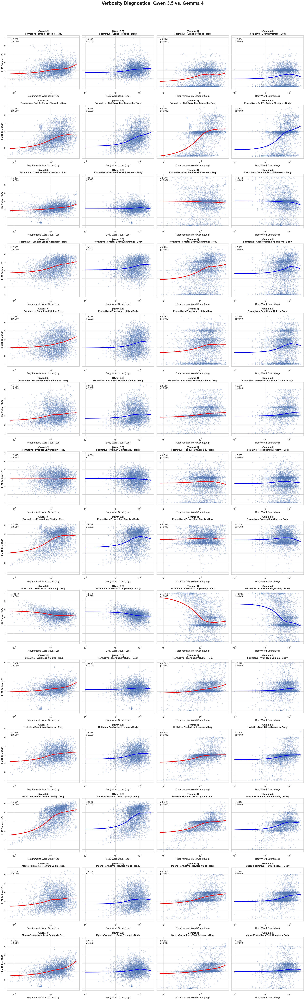

In [45]:
from src.general_analysis.visualisations import plot_verbosity_comparison_twocols

plot_verbosity_comparison_twocols(
    df=final_df,
    models=['Qwen 3.5', 'Gemma 4'],
    model_col='model_name_clean',
    dim_col='dimension_name_clean',
    left_x_col='raw_input_word_count',
    right_x_col='text_word_count',
    log_x=True,
    truncate_pct=0.98,
    left_x_label="Requirements Word Count",
    right_x_label="Body Word Count"
)

## bar charts

In [46]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import spearmanr
from typing import Optional, Dict, List


def plot_stacked_verbosity_breakdown(
    df: pd.DataFrame,
    text_col: str = 'raw_input_word_count',
    rating_col: str = 'mean_rating',
    model_col: str = 'model_name_clean',  # Adjust to match your model column
    dim_col: str = 'dimension_name',
    threshold: int = 200,
    dim_map_clean: Optional[Dict[str, str]] = None,
    plot_order: Optional[List[str]] = None,
    save_path: Optional[str] = None
) -> plt.Figure:
    """
    Takes a raw DataFrame, splits it by a word count threshold, computes Spearman 
    correlations for the under/over brackets, and plots a vertically stacked bar chart.
    """
    if df.empty:
        print("The provided DataFrame is empty. Nothing to plot.")
        return None

    plot_df = df.copy()

    # 1. Map raw dimension names to clean names
    if dim_map_clean:
        plot_df[dim_col] = plot_df[dim_col].map(
            dim_map_clean).fillna(plot_df[dim_col])

    # 2. Filter available dimensions to maintain strict order
    available_dims = None
    if plot_order:
        plot_df = plot_df[plot_df[dim_col].isin(plot_order)]
        available_dims = [
            dim for dim in plot_order if dim in plot_df[dim_col].unique()]
    else:
        available_dims = sorted(plot_df[dim_col].dropna().unique())

    if plot_df.empty:
        print("WARNING: DataFrame is empty after filtering by plot_order.")
        return None

    # 3. Compute correlations for both brackets
    models = sorted(plot_df[model_col].dropna().unique())
    results = []

    for m in models:
        for dim in available_dims:
            sub = plot_df[(plot_df[model_col] == m) &
                          (plot_df[dim_col] == dim)]

            # Under threshold
            sub_under = sub[sub[text_col] <= threshold]
            if len(sub_under) > 5:  # Basic safety check for correlation
                r_under, _ = spearmanr(
                    sub_under[text_col], sub_under[rating_col], nan_policy='omit')
            else:
                r_under = np.nan

            # Over threshold
            sub_over = sub[sub[text_col] > threshold]
            if len(sub_over) > 5:
                r_over, _ = spearmanr(
                    sub_over[text_col], sub_over[rating_col], nan_policy='omit')
            else:
                r_over = np.nan

            results.append({
                'Model Name': m,
                'Dimension': dim,
                'Condition': f'<= {threshold} Words',
                'verbosity_corr': r_under
            })
            results.append({
                'Model Name': m,
                'Dimension': dim,
                'Condition': f'> {threshold} Words',
                'verbosity_corr': r_over
            })

    res_df = pd.DataFrame(results).dropna()

    # 4. Plotting Setup (2 Rows, 1 Column)
    fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(16, 10), sharex=True)
    palette = sns.color_palette("Set3", n_colors=len(models))

    # Top Plot (<= Threshold)
    sns.barplot(
        data=res_df[res_df['Condition'] == f'<= {threshold} Words'],
        x='Dimension', y='verbosity_corr', hue='Model Name',
        order=available_dims, palette=palette, ax=axes[0]
    )
    axes[0].set_title(
        f"Verbosity Correlation: ≤ {threshold} Words (Information Deficit Phase)", fontsize=14, fontweight='bold')
    axes[0].set_ylabel(r'Spearman Correlation ($\rho$)', fontsize=12)
    axes[0].set_xlabel("")  # Hide x-label for top plot
    axes[0].axhline(0, color='black', linewidth=0.8)
    axes[0].grid(axis='y', linestyle='--', alpha=0.7)
    axes[0].set_axisbelow(True)
    axes[0].legend(title='Model Name', bbox_to_anchor=(
        1.02, 1), loc='upper left')

    # Bottom Plot (> Threshold)
    sns.barplot(
        data=res_df[res_df['Condition'] == f'> {threshold} Words'],
        x='Dimension', y='verbosity_corr', hue='Model Name',
        order=available_dims, palette=palette, ax=axes[1]
    )
    axes[1].set_title(
        f"Verbosity Correlation: > {threshold} Words (Reading Fatigue Phase)", fontsize=14, fontweight='bold')
    axes[1].set_ylabel(r'Spearman Correlation ($\rho$)', fontsize=12)
    axes[1].set_xlabel('Dimension', fontsize=12, fontweight='bold')
    axes[1].axhline(0, color='black', linewidth=0.8)
    axes[1].grid(axis='y', linestyle='--', alpha=0.7)
    axes[1].set_axisbelow(True)
    axes[1].get_legend().remove()  # Remove redundant bottom legend

    # 5. Formatting and aesthetics
    # Apply dynamic X-axis label rotation (steep since dimension names can be long)
    axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=45, ha='right')

    # Unify Y-axis limits so visual height comparison between top and bottom is 1:1 accurate
    y_min = res_df['verbosity_corr'].min() - 0.1
    y_max = res_df['verbosity_corr'].max() + 0.1
    axes[0].set_ylim(y_min, y_max)
    axes[1].set_ylim(y_min, y_max)

    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, bbox_inches='tight', dpi=300)
    else:
        plt.show()

    return fig

C:\Users\Wouter Barter\AppData\Local\Temp\ipykernel_25452\3623218896.py:125: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=45, ha='right')


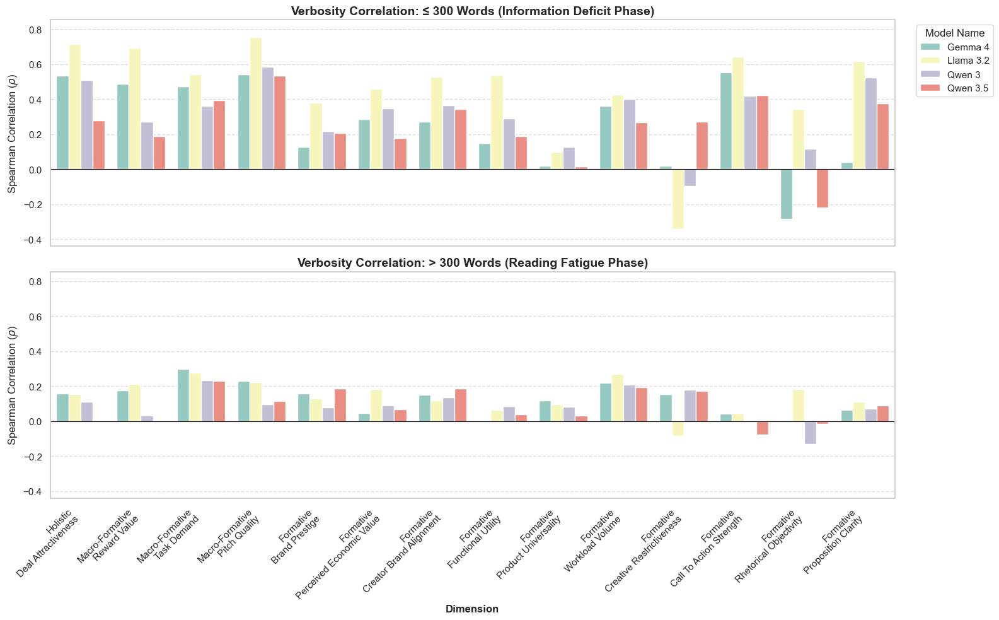

In [47]:

verbosity_plot = plot_stacked_verbosity_breakdown(
    df=final_df,
    text_col='raw_input_word_count',
    rating_col='mean_rating',
    threshold=300,
    dim_map_clean=dim_map_clean,
    plot_order=plot_order
)

C:\Users\Wouter Barter\AppData\Local\Temp\ipykernel_25452\3623218896.py:125: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[1].set_xticklabels(axes[1].get_xticklabels(), rotation=45, ha='right')


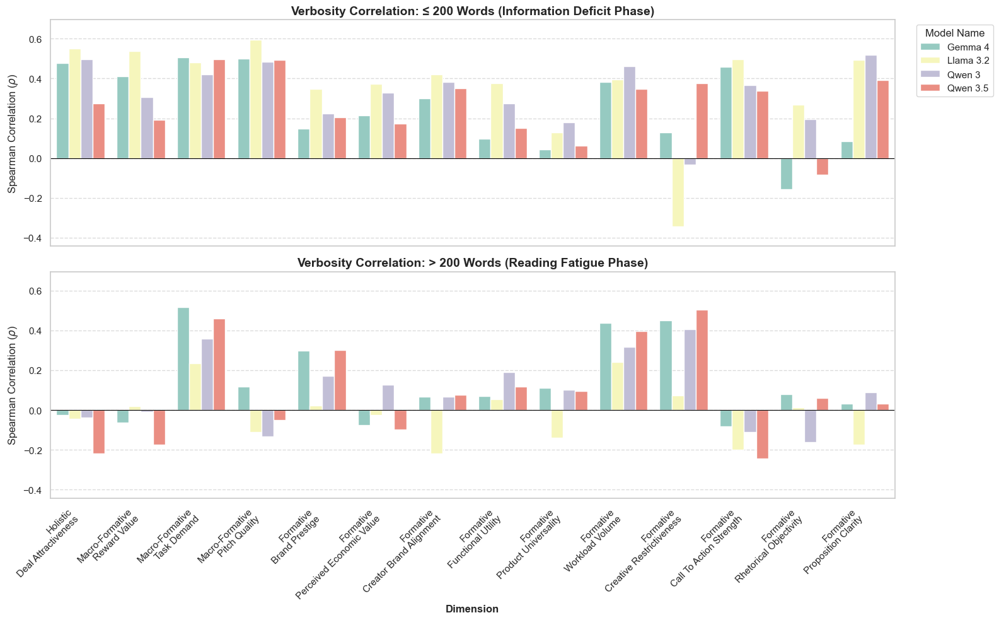

In [48]:
verbosity_plot = plot_stacked_verbosity_breakdown(
    df=final_df,
    text_col='requirements_word_count',
    rating_col='mean_rating',
    threshold=200,
    dim_map_clean=dim_map_clean,
    plot_order=plot_order
)

## Correlations

In [49]:
verbosity_requirements = compute_verbosity_correlations(
    final_df, 'mean_rating', 'log_requirements_word_count')
verbosity_body = compute_verbosity_correlations(
    final_df, 'mean_rating', 'log_text_word_count')

diff_requirements_body = pd.DataFrame({
    'model_name': verbosity_requirements.model_name,
    'dimension_name': verbosity_requirements.dimension_name,
    'verbosity_corr_requirements': verbosity_requirements['verbosity_corr'],
    'verbosity_corr_body': verbosity_body['verbosity_corr'],
    'diff_requirements_body': verbosity_requirements['verbosity_corr'] - verbosity_body['verbosity_corr']
})

# diff_requirements_body.to_csv('diff_requirements_body_barter_long_texts.csv')

diff_requirements_body

,model_name,dimension_name,verbosity_corr_requirements,verbosity_corr_body,diff_requirements_body
0,Gemma 4,Formative\nBrand Prestige,0.146875,0.085327,0.061547
1,Gemma 4,Formative\nCall To Action Strength,0.463801,0.423258,0.040543
2,Gemma 4,Formative\nCreative Restrictiveness,0.137373,-0.114203,0.251577
3,Gemma 4,Formative\nCreator Brand Alignment,0.319401,0.165784,0.153616
4,Gemma 4,Formative\nFunctional Utility,0.093747,0.192395,-0.098648
5,Gemma 4,Formative\nPerceived Economic Value,0.223774,0.268095,-0.044321
6,Gemma 4,Formative\nProduct Universality,0.044149,0.036882,0.007267
7,Gemma 4,Formative\nProposition Clarity,0.094086,-0.002817,0.096903
8,Gemma 4,Formative\nRhetorical Objectivity,-0.142399,-0.287215,0.144817
9,Gemma 4,Formative\nWorkload Volume,0.414716,0.216315,0.198401


---------

# Rest 2

In [50]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import spearmanr
import math


def plot_comprehensive_verbosity_heatmap(
    df,
    models=['Gemma 4', 'Llama 3.2', 'Qwen 3', 'Qwen 3.5'],
    dim_col='dimension_name_clean',
    req_col='requirements_word_count',
    body_col='text_word_count',
    total_col='raw_input_word_count',  # The new threshold column
    threshold=200
):

    dimensions = sorted(df[dim_col].dropna().unique())

    # Build matrices
    matrices = {m: pd.DataFrame(index=dimensions, columns=[
        'Reqs (≤200)', 'Reqs (>200)', 'Body (≤200)', 'Body (>200)'
    ]) for m in models}

    for m in models:
        for dim in dimensions:
            sub = df[(df['model_name_clean'] == m) & (df[dim_col] == dim)]

            # Helper function for safe correlation
            def get_r(data, col):
                if len(data) > 5:
                    return spearmanr(data[col], data['mean_rating'], nan_policy='omit')[0]
                return np.nan

            # The Brilliant Fix: Masking by Total Length, Correlating by Section Length
            matrices[m].loc[dim, 'Reqs (≤200)'] = get_r(
                sub[sub[total_col] <= threshold], req_col)
            matrices[m].loc[dim, 'Reqs (>200)'] = get_r(
                sub[sub[total_col] > threshold], req_col)
            matrices[m].loc[dim, 'Body (≤200)'] = get_r(
                sub[sub[total_col] <= threshold], body_col)
            matrices[m].loc[dim, 'Body (>200)'] = get_r(
                sub[sub[total_col] > threshold], body_col)

    # Convert to float
    for m in models:
        matrices[m] = matrices[m].astype(float)

    # Plotting: 2x2 Grid
    n_rows, n_cols = 2, 2
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(
        16, 12), sharey=True, sharex=True)
    axes = axes.flatten()  # Flatten to 1D array for easy iteration

    cmap = sns.diverging_palette(10, 250, as_cmap=True)

    for i, m in enumerate(models):
        ax = axes[i]

        # Only show colorbar on the rightmost plots (indices 1 and 3)
        show_cbar = (i % 2 != 0)

        sns.heatmap(matrices[m], ax=ax, cmap=cmap, center=0,
                    vmin=-0.5, vmax=0.5, annot=True, fmt=".2f",
                    cbar=show_cbar,
                    cbar_kws={
                        'label': r'Spearman Correlation ($\rho$)'} if show_cbar else None,
                    annot_kws={"size": 10})

        ax.set_title(f"[{m}]\nSectional Correlations (Total Threshold: {threshold})",
                     fontweight='bold', fontsize=13)

        # Y-labels only on the left column
        if i % 2 == 0:
            ax.set_ylabel("Dimension", fontweight='bold')
        else:
            ax.set_ylabel("")

        # X-labels only on the bottom row
        if i >= 2:
            ax.set_xlabel("Text Section & Total Length Bracket",
                          fontweight='bold')
            ax.set_xticklabels(ax.get_xticklabels(), rotation=45, ha='right')
        else:
            ax.set_xlabel("")
            ax.tick_params(axis='x', which='both',
                           bottom=False, labelbottom=False)

    plt.tight_layout()
    plt.show()

In [51]:
bucket_means = final_df.groupby(['analysis_group_full_clean', 'prompt_name', 'analysis_group_clean',
                                'length_bucket'], observed=True)['mean_rating'].mean().reset_index()

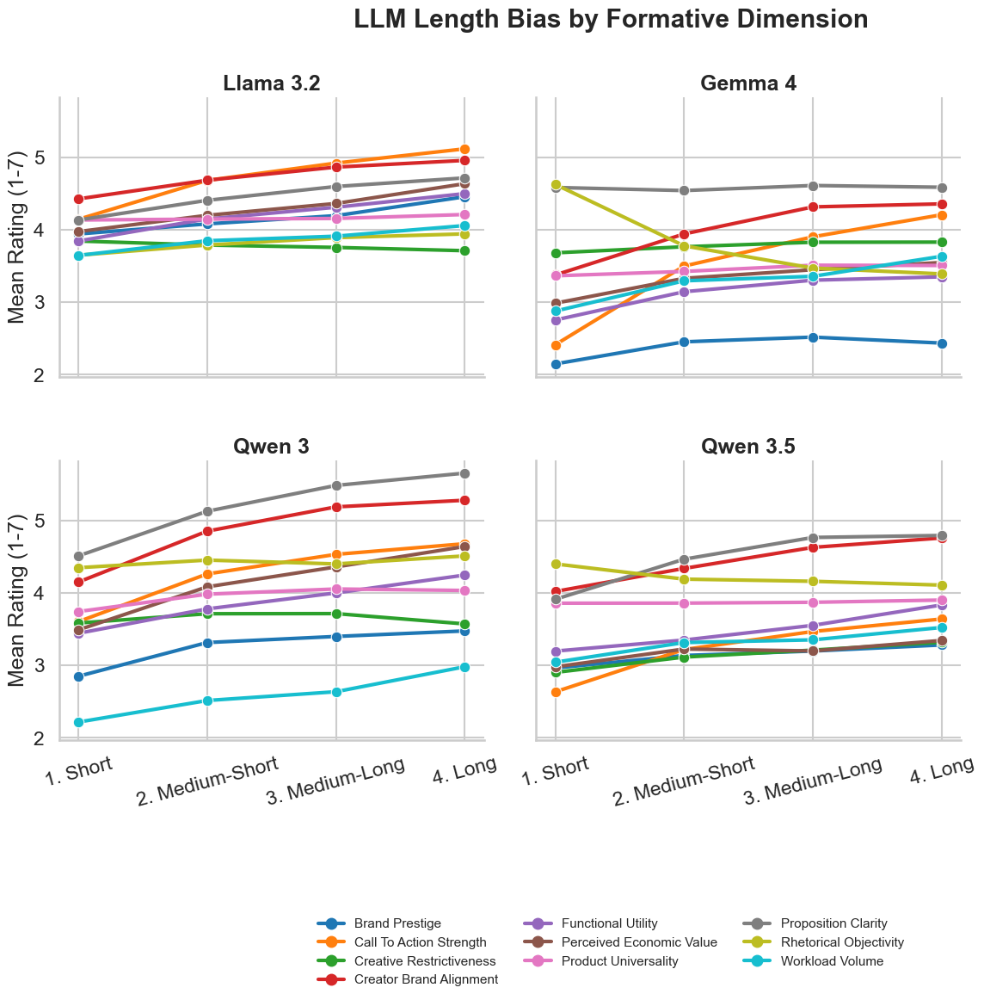

In [52]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure final_df and length_bucket are ready
# final_df['length_bucket'] = pd.qcut(final_df['raw_input_word_count'], q=4, labels=['1. Short', '2. Medium-Short', '3. Medium-Long', '4. Long'])

# Calculate means
bucket_means = final_df.groupby(['analysis_group_full_clean', 'prompt_name', 'analysis_group_clean',
                                'length_bucket'], observed=True)['mean_rating'].mean().reset_index()

# Extract Model Name and Dimension
bucket_means['Model'] = bucket_means['analysis_group_clean'].str.extract(
    r'(.*?)\s+(?:Formative|Holistic|Macro)')
bucket_means['Dimension'] = bucket_means['analysis_group_full_clean'].str.extract(
    r'\n(.*?)\(')

# Define our 4 models
model_order = ['Llama 3.2', 'Gemma 4', 'Qwen 3', 'Qwen 3.5']

sns.set_theme(style="whitegrid", context="talk")

# =====================================================================
# PLOT 2: The Semantic Fan vs. Heuristic Spaghetti (Formative Dimensions)
# =====================================================================
# Filter only for the Formative prompt and our 4 specific models
formative_df = bucket_means[(bucket_means['prompt_name'] == 'Formative') &
                            (bucket_means['Model'].isin(model_order))].copy()

# Create the 2x2 Grid Plot
g2 = sns.relplot(
    data=formative_df,
    x='length_bucket',
    y='mean_rating',
    hue='Dimension',
    col='Model',
    col_order=model_order,
    col_wrap=2,           # <--- This creates the beautiful 2x2 grid
    kind='line',
    marker='o',
    linewidth=3,
    palette='tab10',
    height=5,             # Height of each individual subplot
    aspect=1.2,           # Width-to-height ratio
    # Keeps the 1-7 scale identical across all 4 boxes
    facet_kws={'sharey': True}
)

# Clean up titles and axes
g2.set_titles("{col_name}", weight='bold')
g2.set_axis_labels("", "Mean Rating (1-7)")
g2.fig.suptitle("LLM Length Bias by Formative Dimension",
                y=1.05, weight='bold')

# Rotate X-axis labels for readability
for ax in g2.axes.flat:
    ax.tick_params(axis='x', labelrotation=15)

# Move the legend to the very bottom center
sns.move_legend(g2, "lower center", bbox_to_anchor=(0.5, -0.10),
                ncol=3, title=None, frameon=False, fontsize=11)
plt.subplots_adjust(bottom=0.20, hspace=0.3)

plt.show()

## Relationship between applications and word count

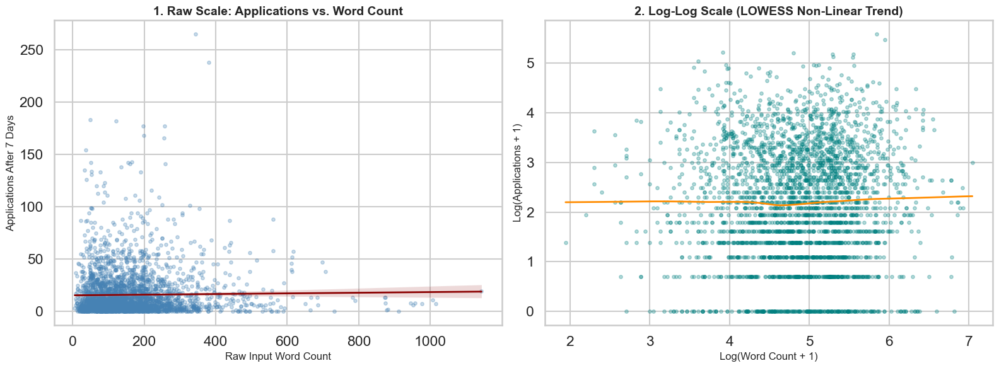

In [53]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Set up the figure
fig, axes = plt.subplots(1, 2, figsize=(16, 6))
sns.set_theme(style="whitegrid")

# ---------------------------------------------------------
# Plot 1: Standard Raw Scale (Scatter + Linear Regression)
# ---------------------------------------------------------
sns.regplot(
    data=og_df,
    x='raw_input_word_count',
    y='apps_after_7_days',
    ax=axes[0],
    scatter_kws={'alpha': 0.3, 'color': 'steelblue', 's': 15},
    line_kws={'color': 'darkred', 'linewidth': 2}
)
axes[0].set_title("1. Raw Scale: Applications vs. Word Count",
                  fontsize=14, fontweight='bold')
axes[0].set_xlabel("Raw Input Word Count", fontsize=12)
axes[0].set_ylabel("Applications After 7 Days", fontsize=12)

# ---------------------------------------------------------
# Plot 2: Log-Log Scale (Scatter + LOWESS Trendline)
# ---------------------------------------------------------
# We use log1p (log(x + 1)) to safely handle any zeros in the data
og_df['log_apps'] = np.log1p(og_df['apps_after_7_days'])
og_df['log_words'] = np.log1p(og_df['raw_input_word_count'])

sns.regplot(
    data=og_df,
    x='log_words',
    y='log_apps',
    ax=axes[1],
    lowess=True,  # Adds a flexible, non-linear trendline
    scatter_kws={'alpha': 0.3, 'color': 'teal', 's': 15},
    line_kws={'color': 'darkorange', 'linewidth': 2}
)
axes[1].set_title("2. Log-Log Scale (LOWESS Non-Linear Trend)",
                  fontsize=14, fontweight='bold')
axes[1].set_xlabel("Log(Word Count + 1)", fontsize=12)
axes[1].set_ylabel("Log(Applications + 1)", fontsize=12)

plt.tight_layout()
plt.show()